In [1]:
using CSV, DataFrames, DrWatson, HypothesisTests, Images, LightGraphs, LinearAlgebra, Query, SimpleWeightedGraphs, Statistics, StatsPlots, GraphPlot, Compose

In [2]:
datasets = vcat(readdir.(joinpath.(readdir(datadir(); join=true), "analysis"), join=true)...)

9-element Vector{String}:
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-06-22/analysis/gcamp6s1sexp5scapforceppuncture"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-06-22/analysis/gcamp6s1sexp5scappuncture1_t1"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-06-22/analysis/gcamp6s1sexp5scappuncture6_t1"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-12-11/analysis/2020-11-11_1"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-12-11/analysis/2020-11-11_2"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-12-11/analysis/2020-11-11_3"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-12-11/analysis/2020-11-17_1"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blackiston/BiobotPunctures/data/2020-12-11/analysis/2020-11-17_2"
 "/home/dgm/Documents/ASU/CalciumSignaling/Blacki

In [3]:
function framesize((n, dataset))
    phase1_tif = load(joinpath(dataset, "phase_1", "video.tif"))
    phase2_tif = load(joinpath(dataset, "phase_2", "video.tif"))
    phase1_frame = mean(phase1_tif, dims=3)[:,:,1];
    phase2_frame = mean(phase2_tif, dims=3)[:,:,1];
    DataFrame(
        dataset=fill(n, 2),
        phase=[1,2],
        height=[size(phase1_frame,1), size(phase2_frame,1)],
        width=[size(phase1_frame, 2), size(phase2_frame, 2)],
        path=fill(relpath(dataset, projectdir()), 2),
    )
end

framesize (generic function with 1 method)

In [4]:
framedata = vcat(framesize.(enumerate(datasets))...)

,dataset,phase,height,width,path
,Int64,Int64,Int64,Int64,String
1,1,1,488,565,data/2020-06-22/analysis/gcamp6s1sexp5scapforceppuncture
2,1,2,658,564,data/2020-06-22/analysis/gcamp6s1sexp5scapforceppuncture
3,2,1,1033,1385,data/2020-06-22/analysis/gcamp6s1sexp5scappuncture1_t1
4,2,2,1171,823,data/2020-06-22/analysis/gcamp6s1sexp5scappuncture1_t1
5,3,1,588,682,data/2020-06-22/analysis/gcamp6s1sexp5scappuncture6_t1
6,3,2,716,593,data/2020-06-22/analysis/gcamp6s1sexp5scappuncture6_t1
7,4,1,440,512,data/2020-12-11/analysis/2020-11-11_1
8,4,2,736,625,data/2020-12-11/analysis/2020-11-11_1
9,5,1,524,371,data/2020-12-11/analysis/2020-11-11_2


In [5]:
function readdata((n, dataset), prefix; ext="csv")
    filenames = filter(f -> startswith(f, prefix) && endswith(f, ext), readdir(dataset))
    paths = joinpath.(dataset, filenames)
    df = DataFrame()
    for path in paths
        _, params, _ = parse_savename(path)
        data = DataFrame(CSV.File(path))
        gf = DataFrame(dataset=fill(n, nrow(data)))
        for (key, value) in params
            gf[!,Symbol(key)] .= value
        end
        gf = hcat(gf, data)
        gf[!, :path] .= relpath(dataset, projectdir())
        gf[!, :phase] .= string.(gf[:, :phase])
        gf[gf.phase .== "1", :phase] .= "before puncture"
        gf[gf.phase .== "2", :phase] .= "after puncture"
        df = isempty(df) ? gf : vcat(df, gf)
    end
    df
end

readdata (generic function with 1 method)

In [6]:
function readdata((n, dataset), prefix, params...; ext="csv")
    data = joinpath(dataset, savename(prefix, Dict(params...), "csv")) |> CSV.File |> DataFrame
    df = DataFrame(dataset=fill(n, nrow(data)))
    df = hcat(df, data)
    df[!, :path] .= relpath(dataset, projectdir())
    df[!, :phase] .= string.(df[:, :phase])
    df[df.phase .== "1", :phase] .= "before puncture"
    df[df.phase .== "2", :phase] .= "after puncture"
    df
end

readdata (generic function with 2 methods)

In [7]:
te = vcat(readdata.(enumerate(datasets), "te")...);

In [8]:
ai = vcat(readdata.(enumerate(datasets), "ai")...);

In [9]:
com = let gdf = groupby(unique(te, [:dataset, :phase, :source_x, :source_y]), [:dataset, :phase])
    combine(gdf, :source_x => mean => :x, :source_y => mean => :y)
end;

In [10]:
sort!(te, [:dataset, order(:phase, rev=true), :p]);

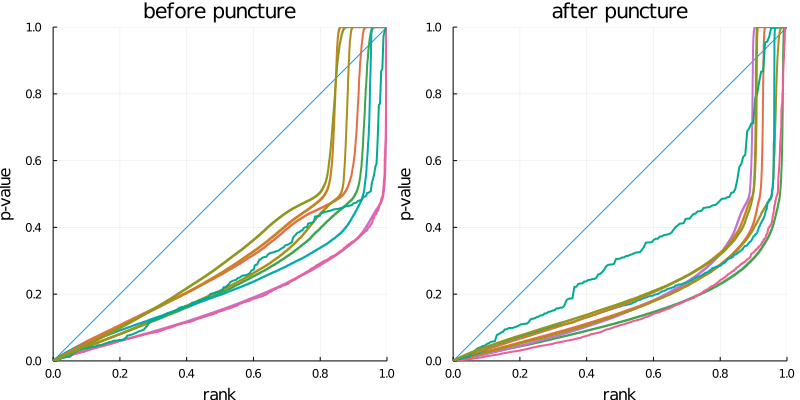

In [11]:
ps = []
for group in groupby(te, :phase)
    p = plot([0,1], [0,1], legend=false, xlim=(0,1), ylim=(0, 1), aspectratio=1.0, xlabel="rank", ylabel="p-value", title=group.phase[1])
    for data in groupby(group, :dataset)
        @df data plot!(p, range(0.0, 1.0, length=length(:p)), :p, linewidth=2)
    end
    push!(ps, p)
end
plot(ps..., size=(800,400), fmt=:png)

In [12]:
distance = plot(xlabel="Distance Between Cells", ylabel="TE (nats)")
te |> @filter(_.p < 0.05 && _.dataset == 1 && _.source != _.target) |>
    @df scatter!(distance, :distance, :value, group=:phase,
        markersize=3, α=0.5, markerstrokewidth=0.5, ylim=(0, 1))

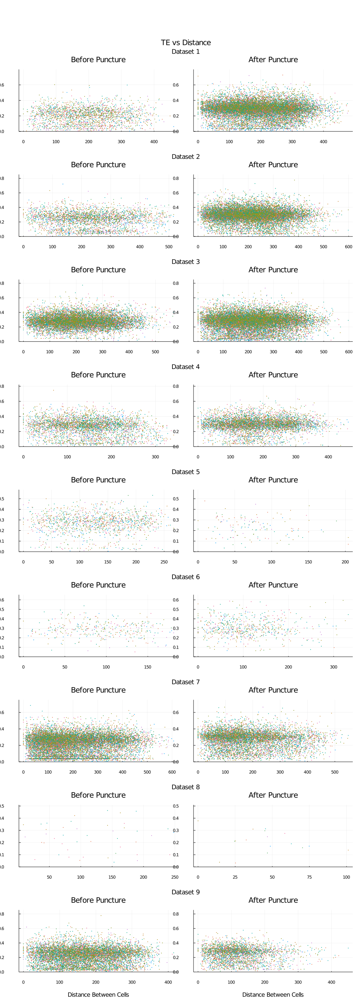

In [13]:
let ps = []
    layout = @layout [
        b{0.05h}
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
        [
            b{0.01h}
            Plots.GridLayout(1,2)
        ]
    ]
    row, col = 1, 1
    for dataset in groupby(te, :dataset)
        p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Dataset $(dataset.dataset[1])", 12, :center))])
        push!(ps, p)
        for phase in groupby(dataset, :phase)
            p = phase |> 
                @filter(_.p < 0.05) |>
                @df scatter(:distance, :value, group=:delay,
                    markersize=2,
                    α=1.,
                    markerstrokewidth=0,
                    ylim=(0, 1.1*maximum(dataset.value)),
                    xlabel=(row == length(datasets)) ? "Distance Between Cells" : "",
                    ylabel=(col == 1) ? "TE (nats)" : "",
                    title=phase.phase |> first |> titlecase,
                    legend=false
                )
            push!(ps, p)
            col += 1
        end
        row += 1
        col = 1
    end
    p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("TE vs Distance", :center))])
    plot(p, ps...; layout, size=(1000,2800), fmt=:png)
end

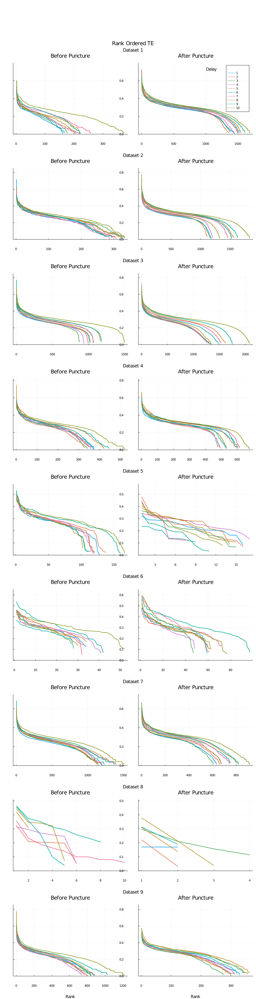

In [14]:
let ps = []
    layout = @layout [
        b{0.05h}
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
        [
            b{0.01h}
            Plots.grid(1,2)
        ]
    ]
    row, col = 1, 1
    for dataset in groupby(te, :dataset)
        p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Dataset $(dataset.dataset[1])", 12, :center))])
        push!(ps, p)
        for phase in groupby(dataset, :phase)
            p = plot(ylim=(0, 1.1*maximum(dataset.value)),
                xlabel=(row == length(datasets)) ? "Rank" : "",
                ylabel=(col == 1) ? "TE (nats)" : "",
                title=phase.phase |> first |> titlecase,
                bg_color_legend=false,
                legend_title="Delay"
            )
            for delay in groupby(phase, :delay; sort=true)
                df = sort(delay, :value; rev=true) |>
                    @filter(_.p < 0.05) |>
                    DataFrame
                if !isempty(df)
                    @df df plot!(p, :value, group=:delay, linewidth=2, legend=(row == 1 && col == 2))
                end
            end
            push!(ps, p)
            col += 1
        end
        row += 1
        col = 1
    end
    p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Rank Ordered TE", :center))])
    plot(p, ps...; layout, size=(1000, 3900), fmt=:png)
end

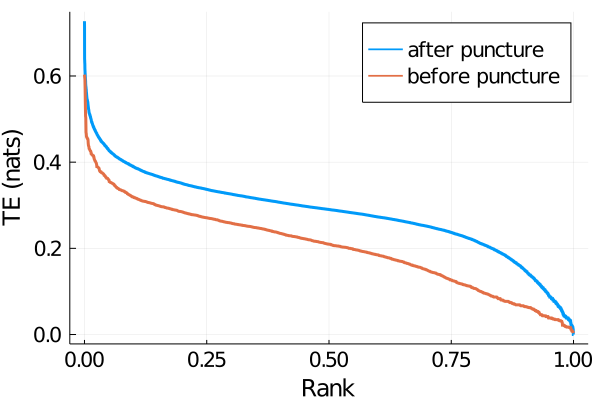

In [15]:
scaling = plot(titlefont=10, xlabel="Rank", ylabel="TE (nats)",
    tickfontsize=14, legendfontsize=14, labelfontsize=16)
te |> @filter(_.p < 0.05 && _.phase == "after puncture" && _.dataset == 1) |>
    @df plot!(scaling, range(0,1,length=length(:value)), sort(:value; rev=true), label="after puncture", linewidth=3)
te |> @filter(_.p < 0.05 && _.phase == "before puncture" && _.dataset == 1) |>
    @df plot!(scaling, range(0,1,length=length(:value)), sort(:value; rev=true), label="before puncture", linewidth=3)

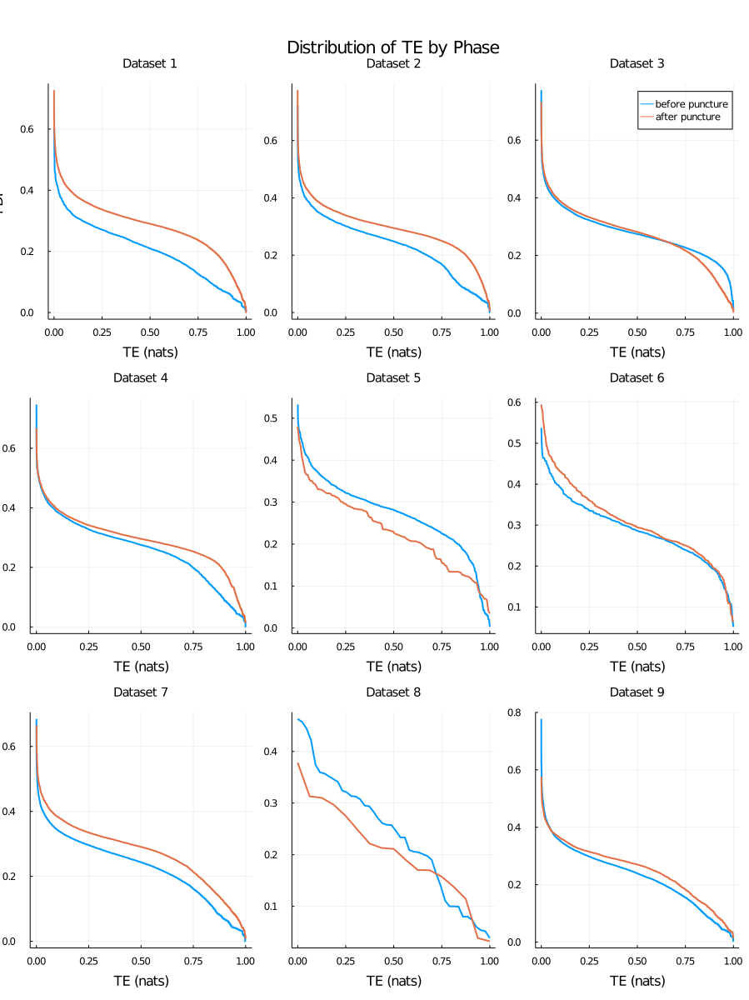

In [16]:
let ps = []
    col = 1
    layout = @layout [
        b{0.05h}
        Plots.grid(1, 3)
        Plots.grid(1, 3)
        Plots.grid(1, 3)
    ]
    for dataset in groupby(te, :dataset)
        title = "Dataset $(dataset.dataset[1])"
        xlabel = "TE (nats)"
        ylabel = (col == 1) ? "PDF" : ""
        legend = (col == 3) ? :best : :none
        titlefont = (10)
        p = plot(titlefont=10, xlabel=xlabel, ylabel=ylabel, title=title, bg_color_legend=false, box_color_legend=false, legend=legend)
        dataset |> @filter(_.p < 0.05 && _.phase == "before puncture") |> @df plot!(p, range(0,1,length=length(:value)), sort(:value; rev=true), label="before puncture", linewidth=2)
        dataset |> @filter(_.p < 0.05 && _.phase == "after puncture") |> @df plot!(p, range(0,1,length=length(:value)), sort(:value; rev=true), label="after puncture", linewidth=2)
        push!(ps, p)
        col += 1
    end
    p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Distribution of TE by Phase", :center))])
    plot(p, ps..., layout=layout, size=(900, 1200), fmt=:png)
end

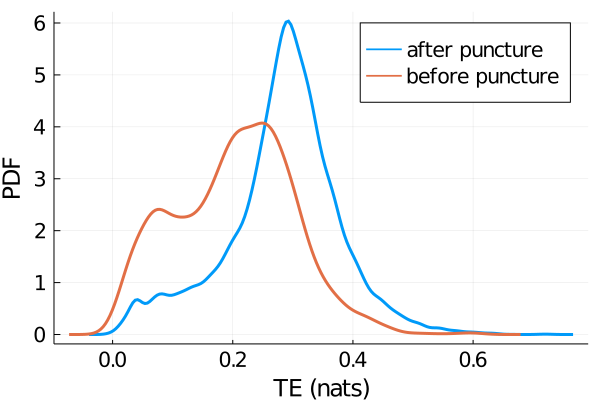

In [17]:
dist = plot(titlefont=10, xlabel="TE (nats)", ylabel="PDF",
    tickfontsize=14, legendfontsize=14, labelfontsize=16)
te |> @filter(_.p < 0.05 && _.dataset == 1) |> @df density!(dist, :value, group=:phase, linewidth=3)

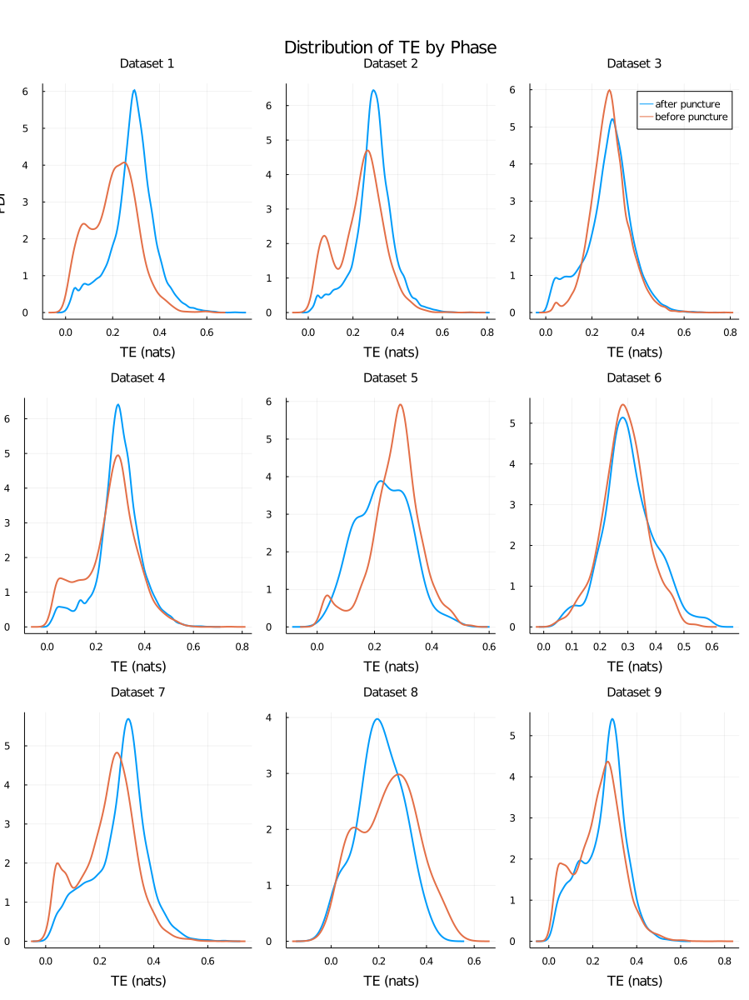

In [18]:
let ps = []
    col = 1
    layout = @layout [
        b{0.05h}
        Plots.grid(1, 3)
        Plots.grid(1, 3)
        Plots.grid(1, 3)
    ]
    for dataset in groupby(te, :dataset)
        title = "Dataset $(dataset.dataset[1])"
        xlabel = "TE (nats)"
        ylabel = (col == 1) ? "PDF" : ""
        legend = (col == 3) ? :best : :none
        titlefont = (10)
        p = plot(titlefont=10, xlabel=xlabel, ylabel=ylabel, title=title, bg_color_legend=false, box_color_legend=false)
        push!(ps, dataset |> @filter(_.p < 0.05) |> @df StatsPlots.density!(p, :value, group=:phase, linewidth=2, legend=legend))
        col += 1
    end
    p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Distribution of TE by Phase", :center))])
    plot(p, ps..., layout=layout, size=(900, 1200), fmt=:png)
end

In [19]:
Base.angle(x,y) = angle(x + y*im)
Base.angle(xs::AbstractVector) = angle(xs...)

In [20]:
te.angle = vec(mapslices(angle, Array(te[:,[:target_x, :target_y]]) - Array(te[:, [:source_x, :source_y]]), dims=2));

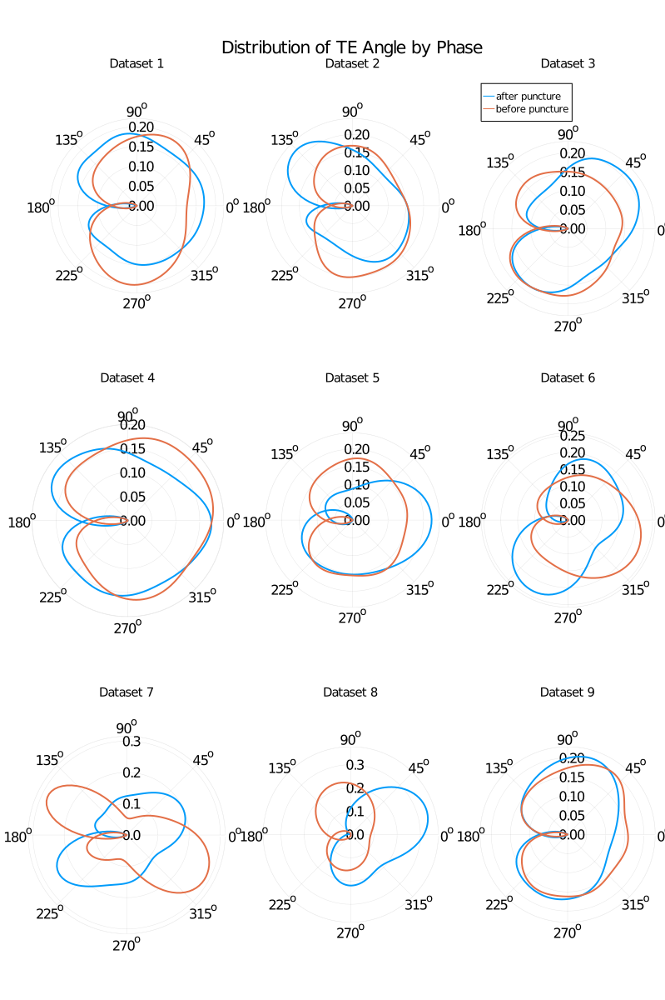

In [21]:
let ps = []
    col = 1
    layout = @layout [
        b{0.05h}
        Plots.grid(1, 3)
        Plots.grid(1, 3)
        Plots.grid(1, 3)
    ]
    for dataset in groupby(te, :dataset)
        title = "Dataset $(dataset.dataset[1])"
        xlabel = "TE (nats)"
        ylabel = (col == 1) ? "PDF" : ""
        titlefont = (10)
        legend = (col == 3) ? :outertop : :none
        p = plot(titlefont=10, xlabel=xlabel, ylabel=ylabel, title=title, legend=legend)
        push!(ps, dataset |> @filter(_.p < 0.05) |> @df StatsPlots.density!(p, :angle, group=:phase, linewidth=2, proj=:polar))
        col += 1
    end
    p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Distribution of TE Angle by Phase", :center))])
    plot(p, ps..., layout=layout, size=(800, 1200), fmt=:png)
end

In [22]:
function graph(df)
    idx = [df.source; df.target] |> sort |> unique |> enumerate .|> reverse |> Dict
    G = SimpleWeightedDiGraph(length(idx))
    for row in eachrow(df)
        add_edge!(G, idx[row.source], idx[row.target], row.value)
    end
    G
end

graph (generic function with 1 method)

In [23]:
gs = rename!(combine(graph, groupby(filter(r -> r.p < 0.05, te), [:dataset, :phase])), :x1 => :graph);

In [24]:
function graph_histogram(func, df; label=string(func), mode=:histogram)
    plt = (mode == :density) ? StatsPlots.density : histogram;
    plt! = (mode == :density) ? StatsPlots.density! : histogram!;
    yl = (mode == :density) ? "PDF" : "Count"
    
    layout = @layout [
        b{0.05h}
        Plots.grid(1, 3)
        Plots.grid(1, 3)
        Plots.grid(1, 3)
    ]
    
    ps = []
    row, col = 1, 1
    for dataset in groupby(df, :dataset)
        p = plt(axis=false, grid=false, xticks=false, yticks=false, title="Dataset $(dataset.dataset[1])")
        for row in eachrow(dataset)
            # ER = erdos_renyi(nv(row.graph), ne(row.graph), is_directed=true)
            plt!(p, func(row.graph), label=row.phase, nbin=50, 
                fillalpha = 0.3,
                xlabel=label,
                ylabel=yl,
                titlefont=(10),
                legend=:best)
            col += 1
        end
        push!(ps, p)
        col = 1
        row += 1
    end
    p = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("$label Histogram", :center))])
    plot(p, ps...; layout, size=(1000,800), fmt=:png)
end

graph_histogram (generic function with 1 method)

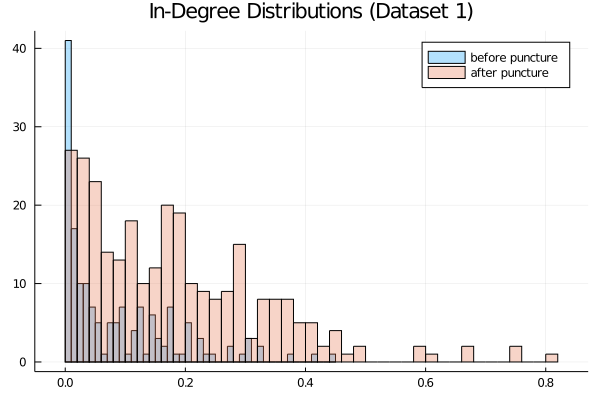

In [25]:
let N = nv(gs[1,:graph]), M = nv(gs[2,:graph])
    histogram(indegree(gs[1,:graph]) / N, nbin=50, fillalpha=0.3, label="before puncture")
    histogram!(indegree(gs[2,:graph]) / M, nbin=50, fillalpha=0.3, label="after puncture", title="In-Degree Distributions (Dataset 1)")
end

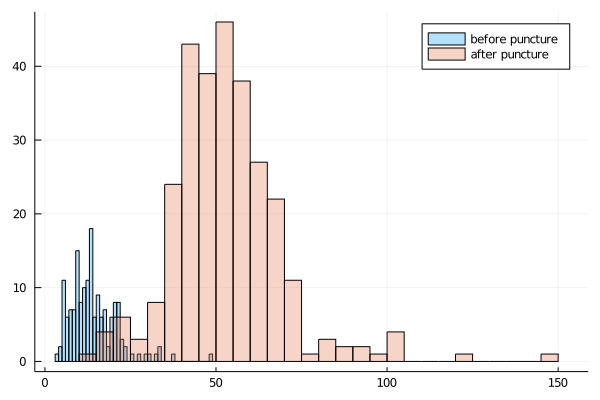

In [26]:
histogram(outdegree(gs[1,:graph]), nbin=50, fillalpha=0.3, label="before puncture")
histogram!(outdegree(gs[2,:graph]), nbin=50, fillalpha=0.3, label="after puncture")

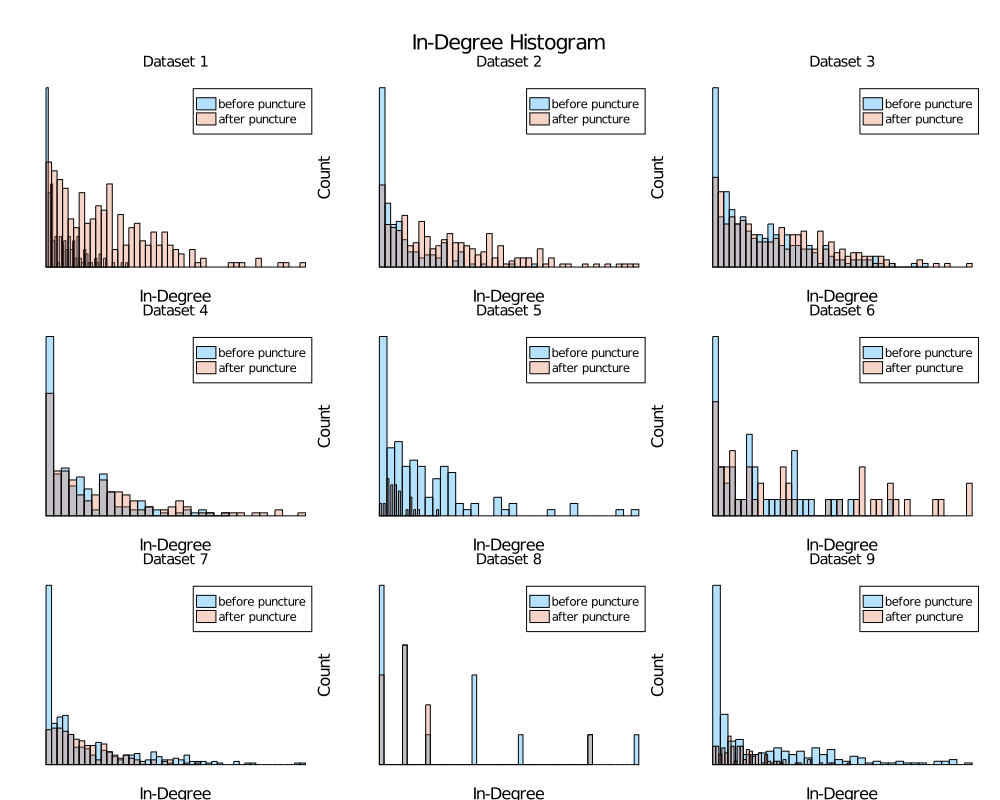

In [27]:
graph_histogram(indegree, gs; label="In-Degree")

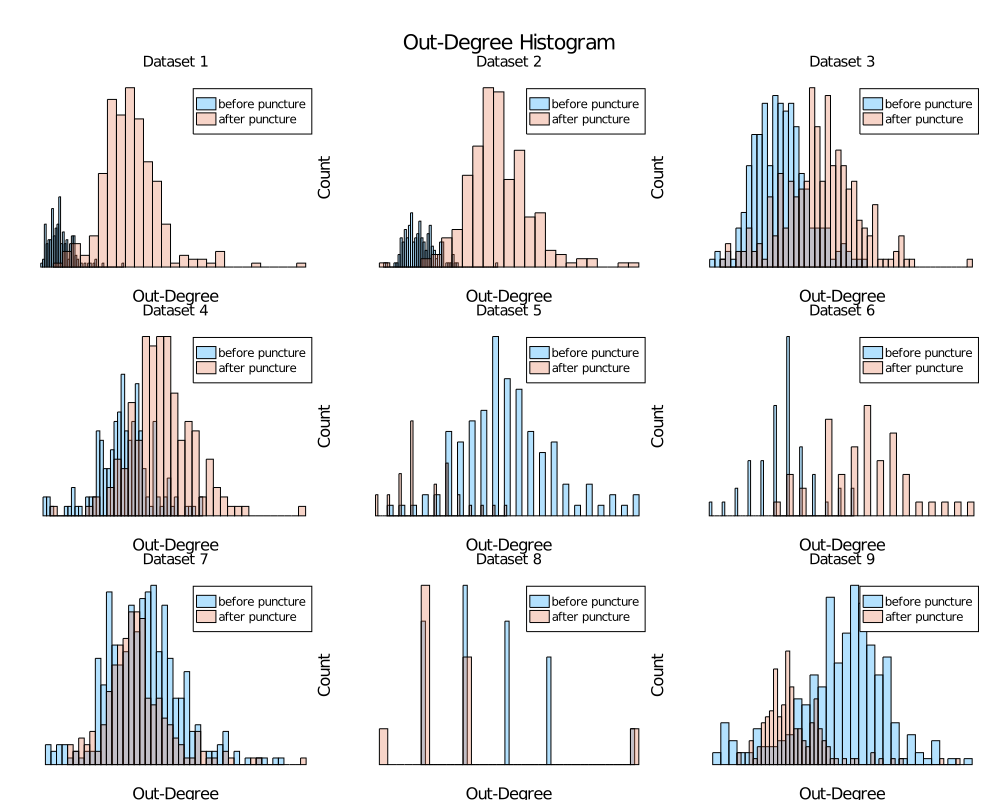

In [28]:
graph_histogram(outdegree, gs; label="Out-Degree")

In [29]:
gs.μoutdegree = mean.(outdegree.(gs.graph));

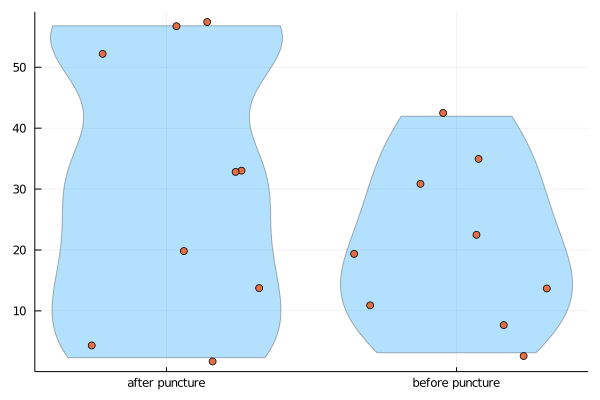

In [30]:
@df gs violin(:phase, :μoutdegree, α=0.3)
@df gs dotplot!(:phase, :μoutdegree, legend=false)

In [31]:
δoutdegree = gs[gs.phase .== "before puncture", :μoutdegree] .- gs[gs.phase .== "after puncture", :μoutdegree];
δoutdegree[[5,7,9]] *= -1

3-element Vector{Float64}:
  -6.583402260821616
  -2.1355043568158294
 -11.03565570232237

In [32]:
EqualVarianceTTest(gs[gs.phase .== "before puncture", :μoutdegree], gs[gs.phase .== "after puncture", :μoutdegree])

Two sample t-test (equal variance)
----------------------------------
Population details:
    parameter of interest:   Mean difference
    value under h_0:         0
    point estimate:          -9.64572
    95% confidence interval: (-27.7211, 8.4296)

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.2746

Details:
    number of observations:   [9,9]
    t-statistic:              -1.1312668903958876
    degrees of freedom:       16
    empirical standard error: 8.526479471065693


In [33]:
OneSampleTTest(δoutdegree)

One sample t-test
-----------------
Population details:
    parameter of interest:   Mean
    value under h_0:         0
    point estimate:          -14.0356
    95% confidence interval: (-25.0752, -2.9961)

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0189

Details:
    number of observations:   9
    t-statistic:              -2.9318366271565575
    degrees of freedom:       8
    empirical standard error: 4.7873154066699035


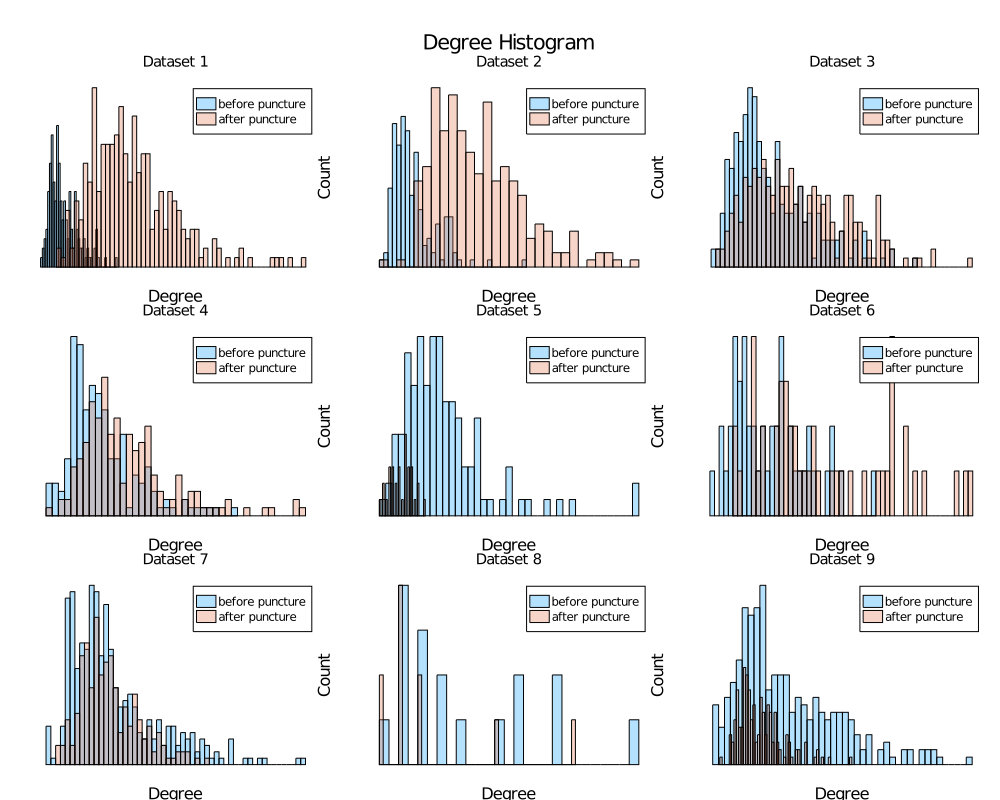

In [34]:
graph_histogram(degree, gs; label="Degree")

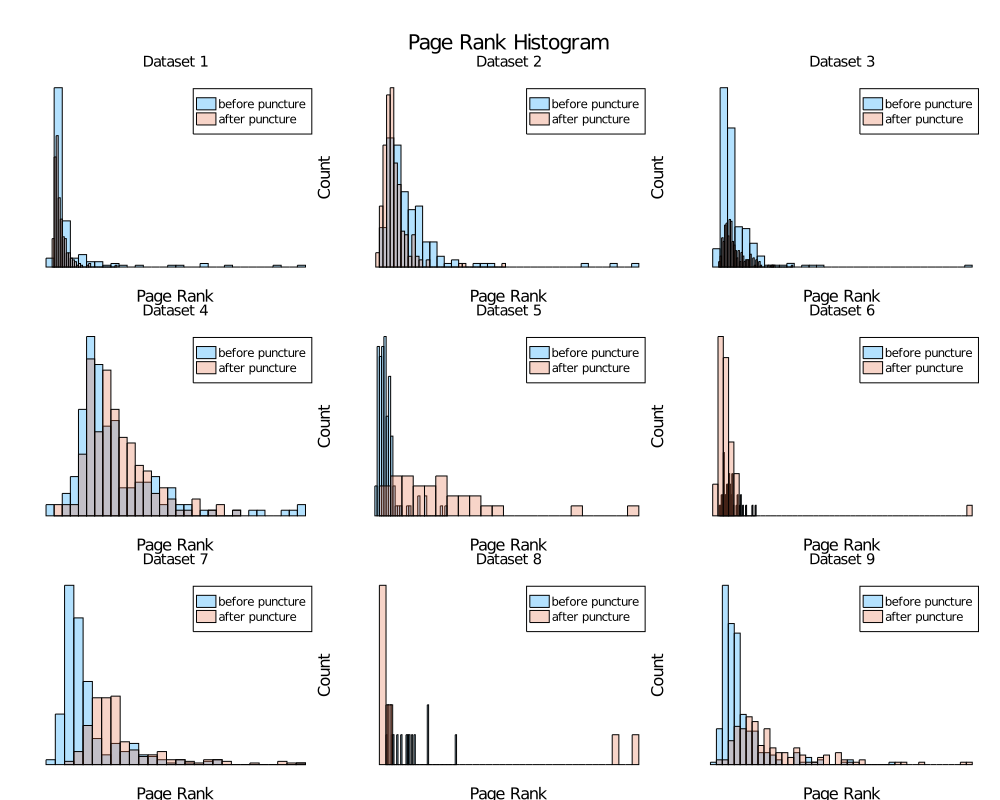

In [35]:
graph_histogram(pagerank∘SimpleDiGraph, gs; label="Page Rank")

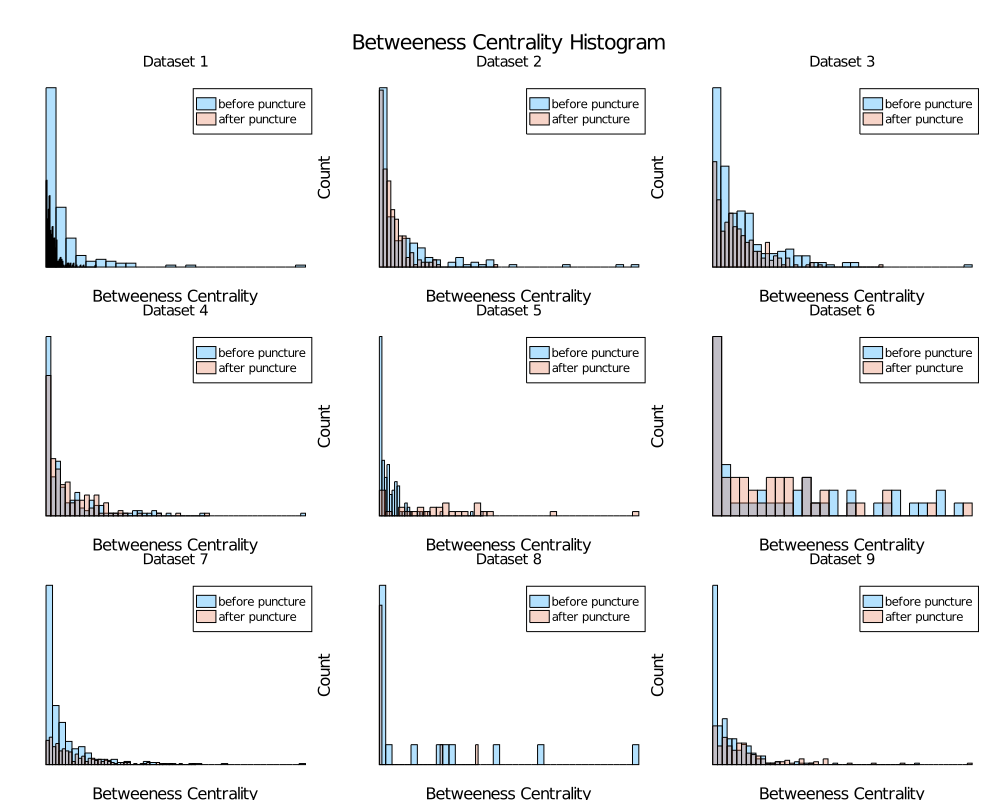

In [36]:
graph_histogram(betweenness_centrality∘SimpleDiGraph, gs; label="Betweeness Centrality", mode=:histogram)

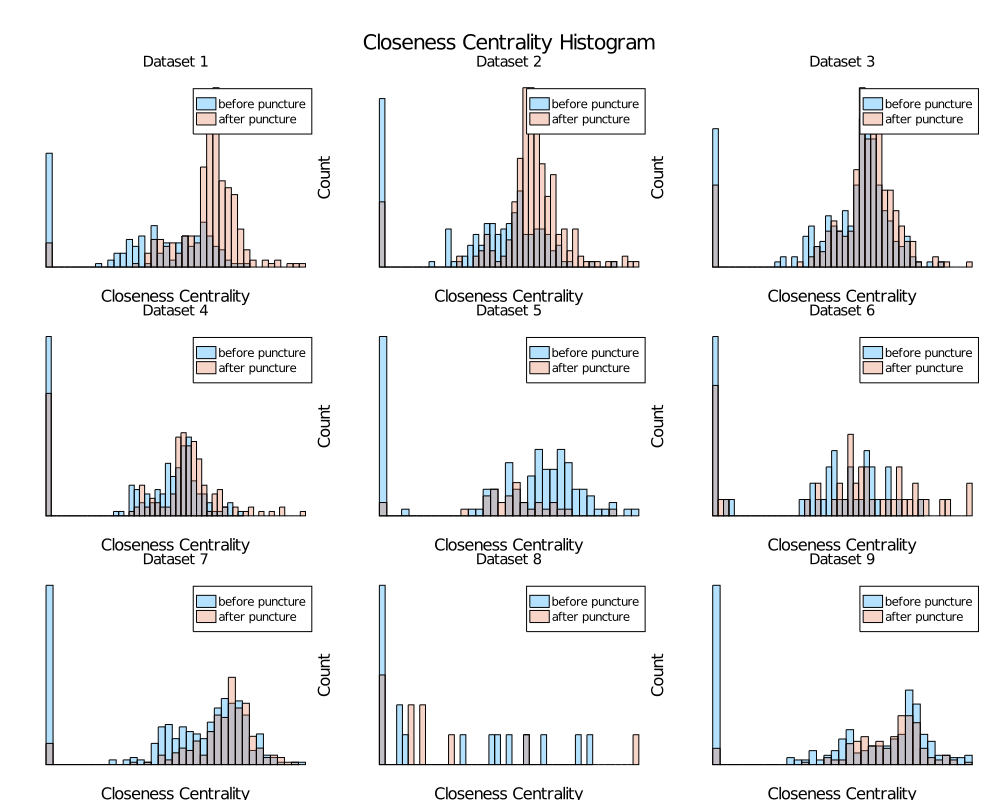

In [37]:
graph_histogram(closeness_centrality∘SimpleDiGraph, gs; label="Closeness Centrality", mode=:histogram)

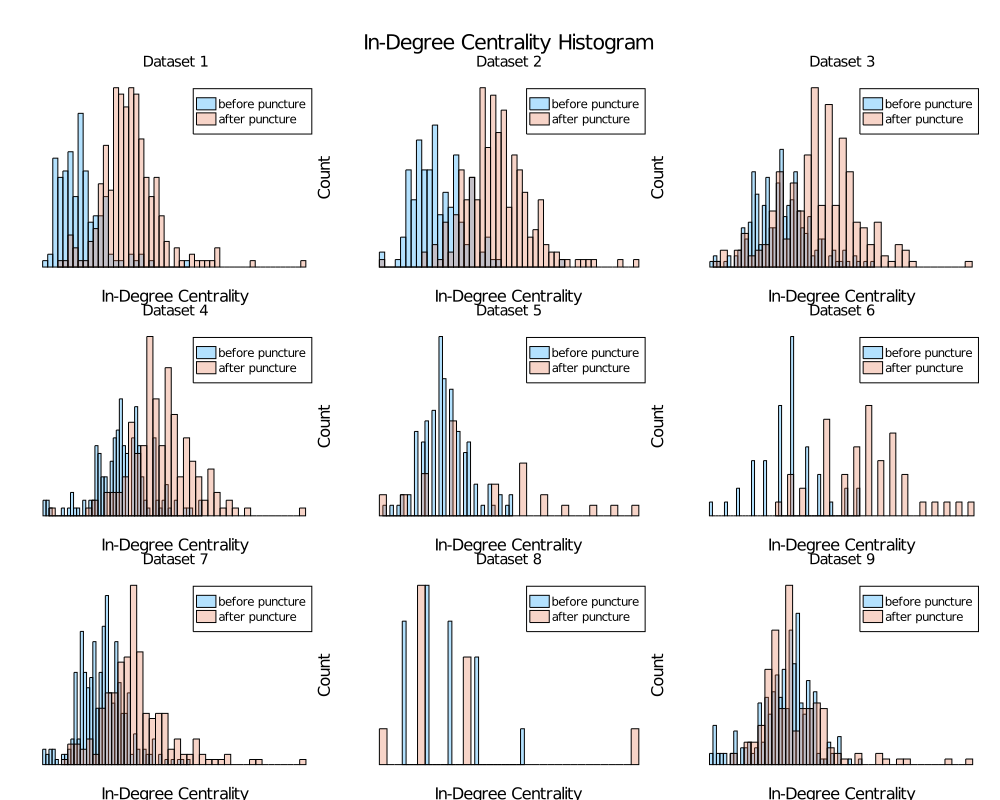

In [38]:
graph_histogram(indegree_centrality∘SimpleDiGraph, gs; label="In-Degree Centrality", mode=:histogram)

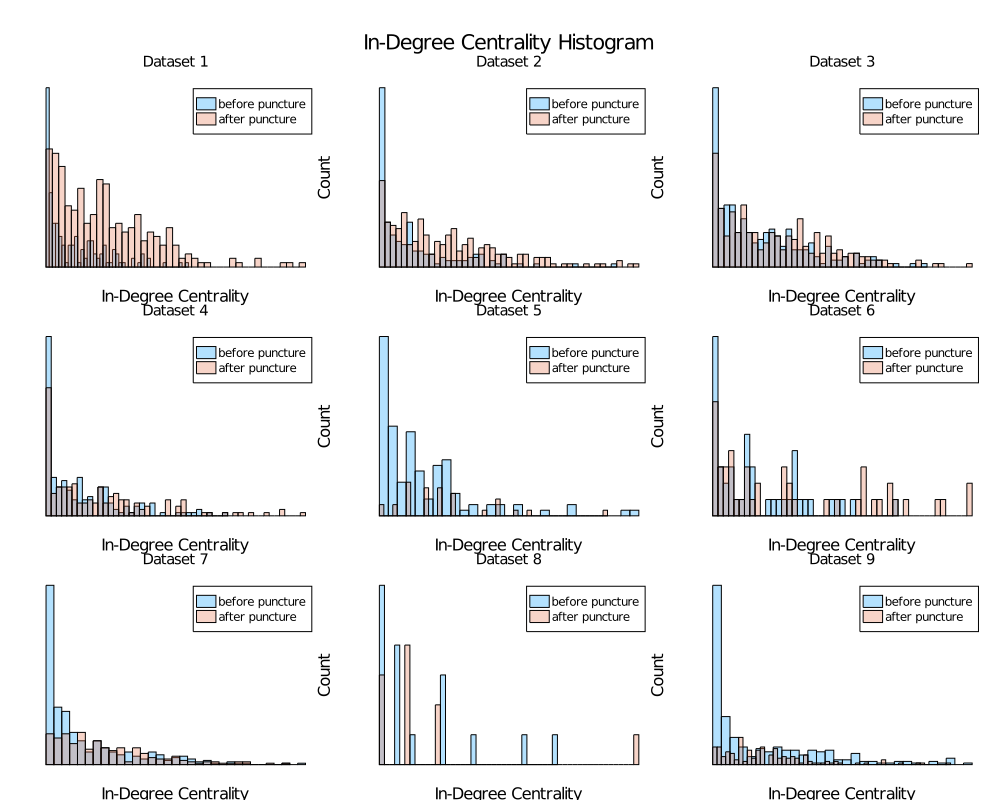

In [39]:
graph_histogram(indegree_centrality, gs; label="In-Degree Centrality", mode=:histogram)

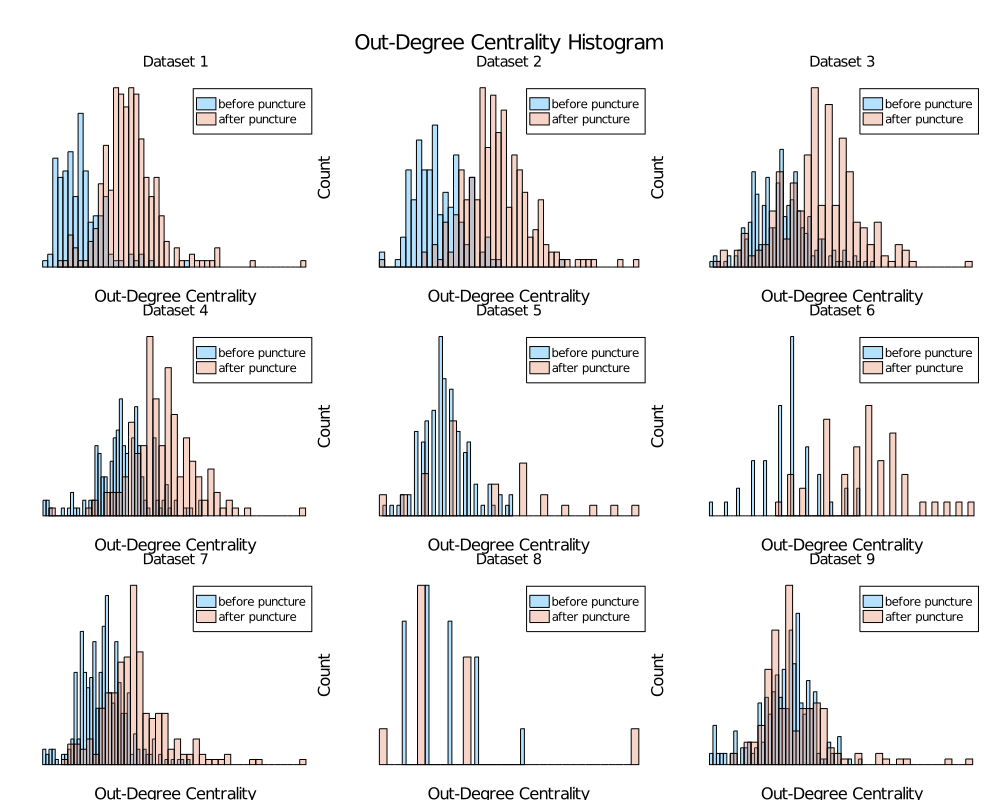

In [40]:
graph_histogram(outdegree_centrality, gs; label="Out-Degree Centrality", mode=:histogram)

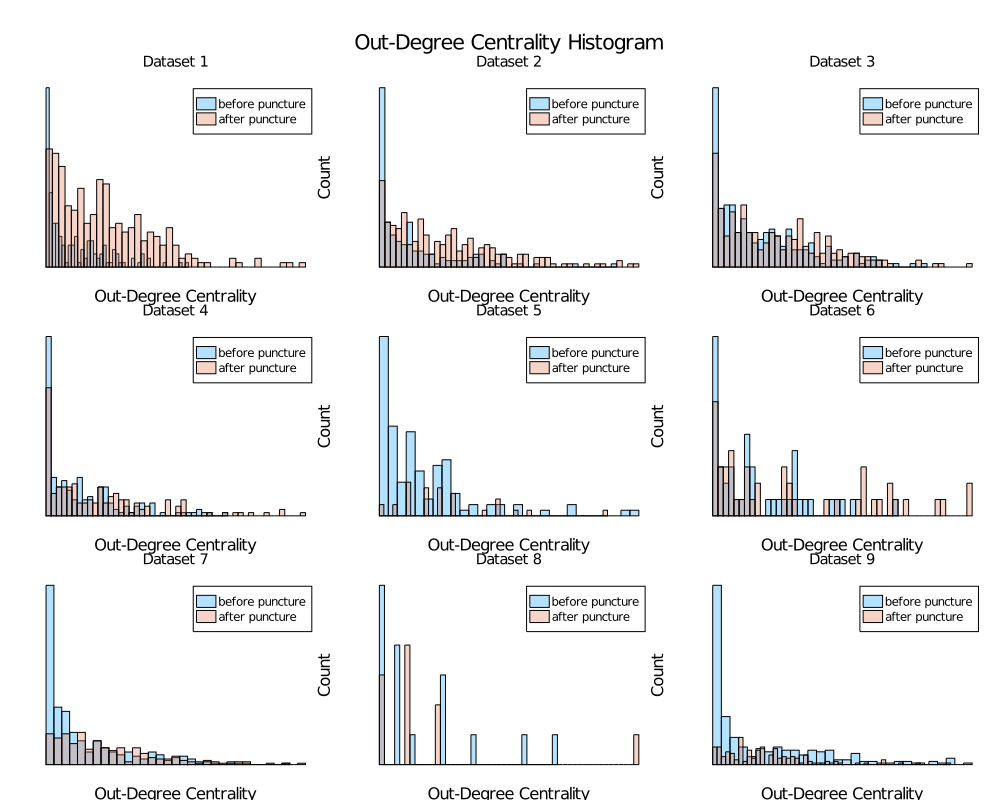

In [41]:
graph_histogram(outdegree_centrality∘SimpleDiGraph, gs; label="Out-Degree Centrality", mode=:histogram)

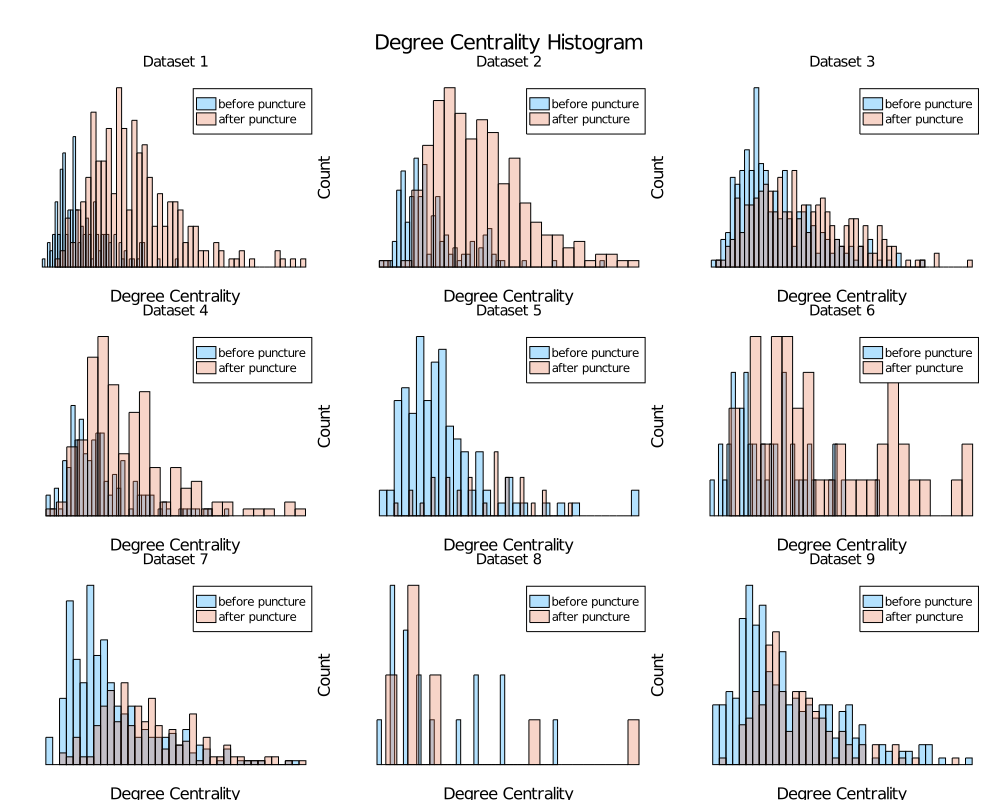

In [42]:
graph_histogram(degree_centrality, gs; label="Degree Centrality", mode=:histogram)

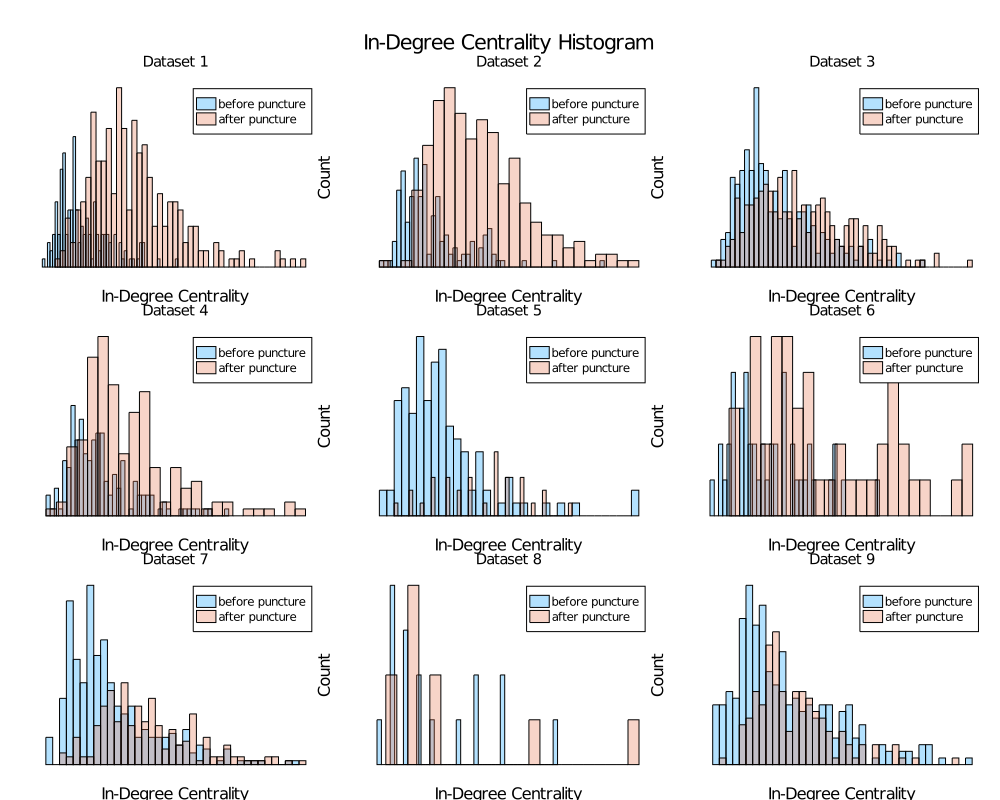

In [43]:
graph_histogram(degree_centrality∘SimpleDiGraph, gs; label="In-Degree Centrality", mode=:histogram)

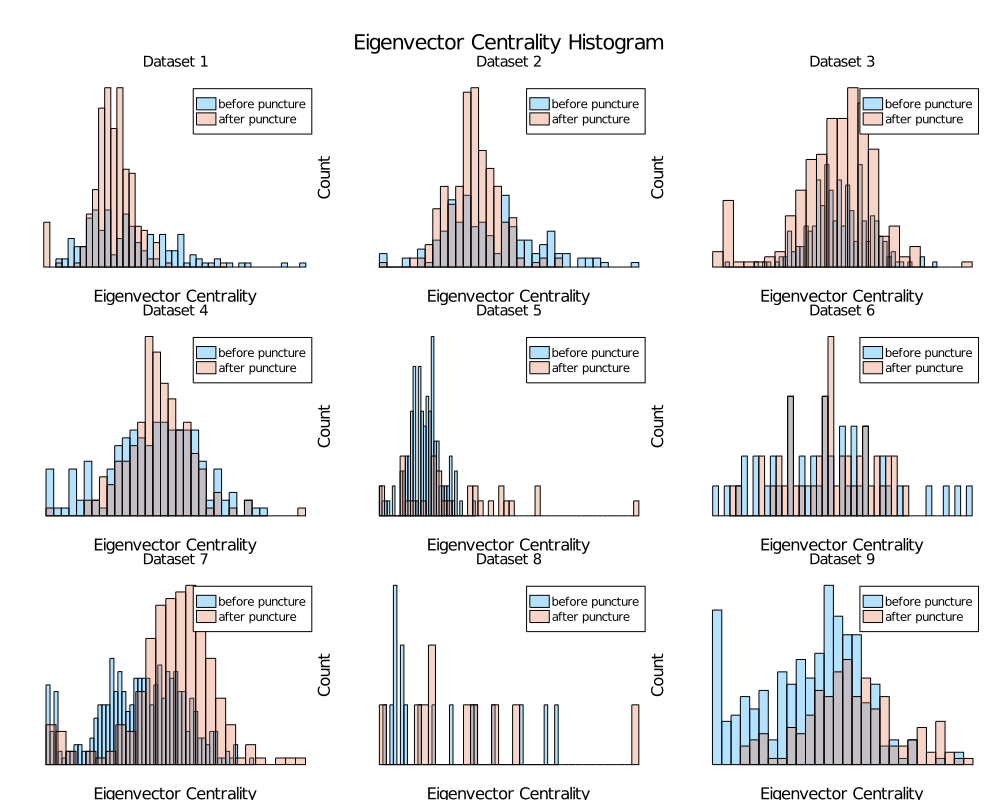

In [44]:
graph_histogram(eigenvector_centrality, gs; label="Eigenvector Centrality", mode=:histogram)

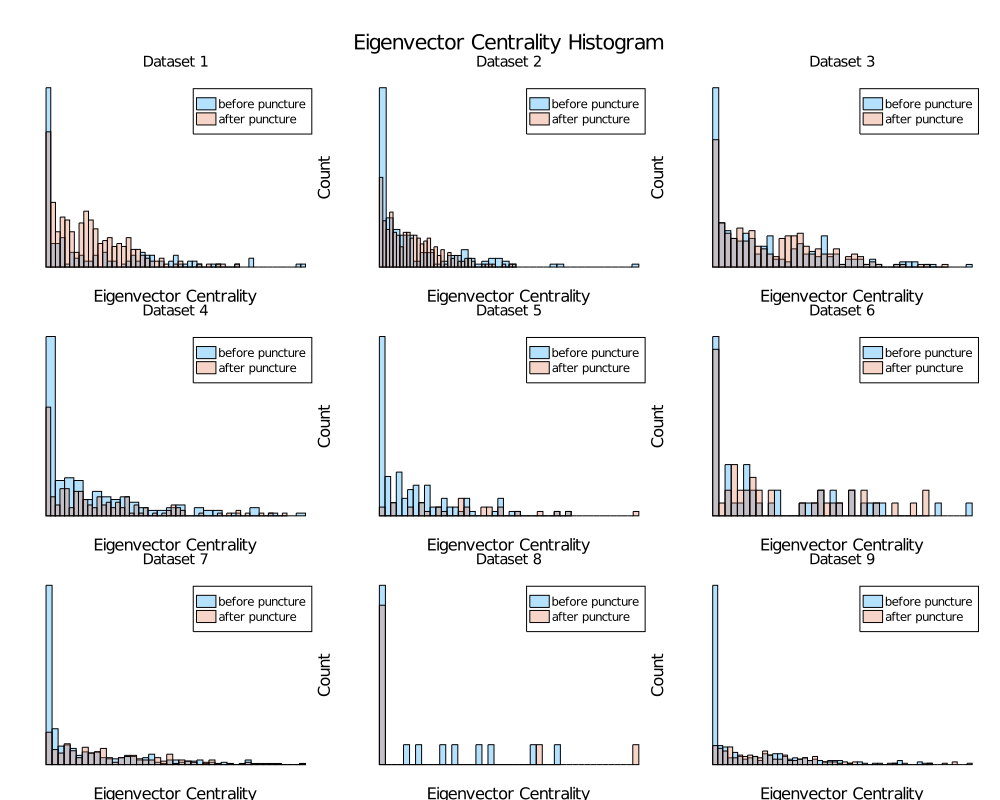

In [45]:
graph_histogram(eigenvector_centrality∘SimpleDiGraph, gs; label="Eigenvector Centrality", mode=:histogram)

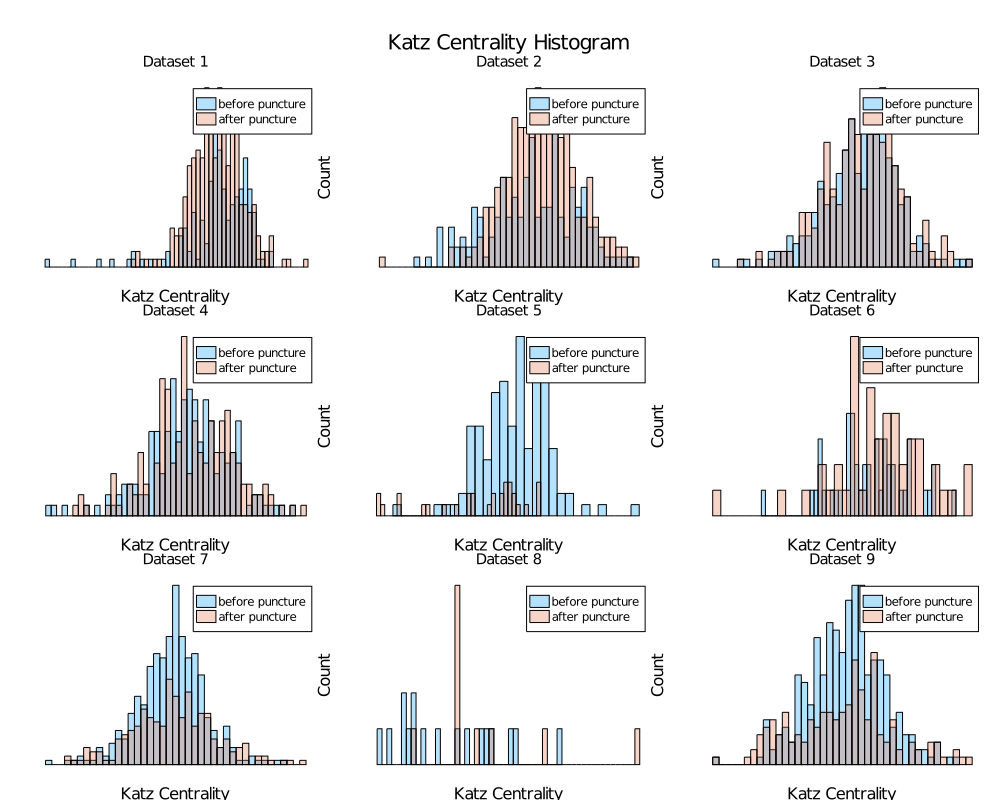

In [46]:
graph_histogram(katz_centrality∘SimpleDiGraph, gs; label="Katz Centrality", mode=:histogram)

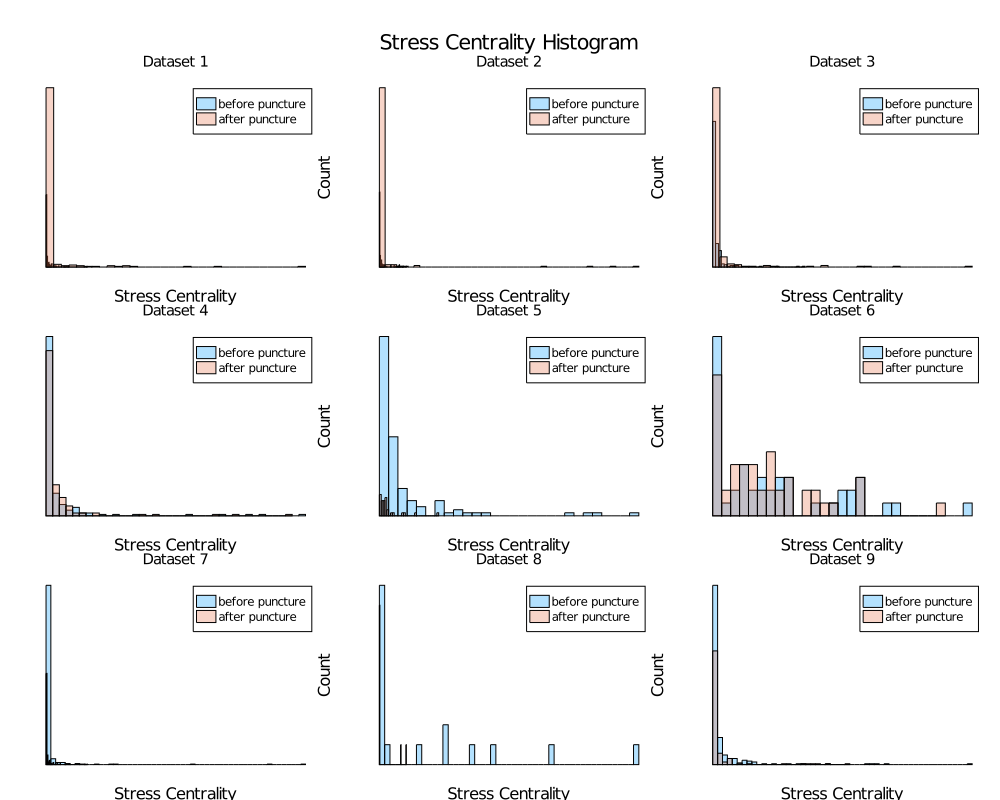

In [47]:
graph_histogram(stress_centrality, gs; label="Stress Centrality", mode=:histogram)

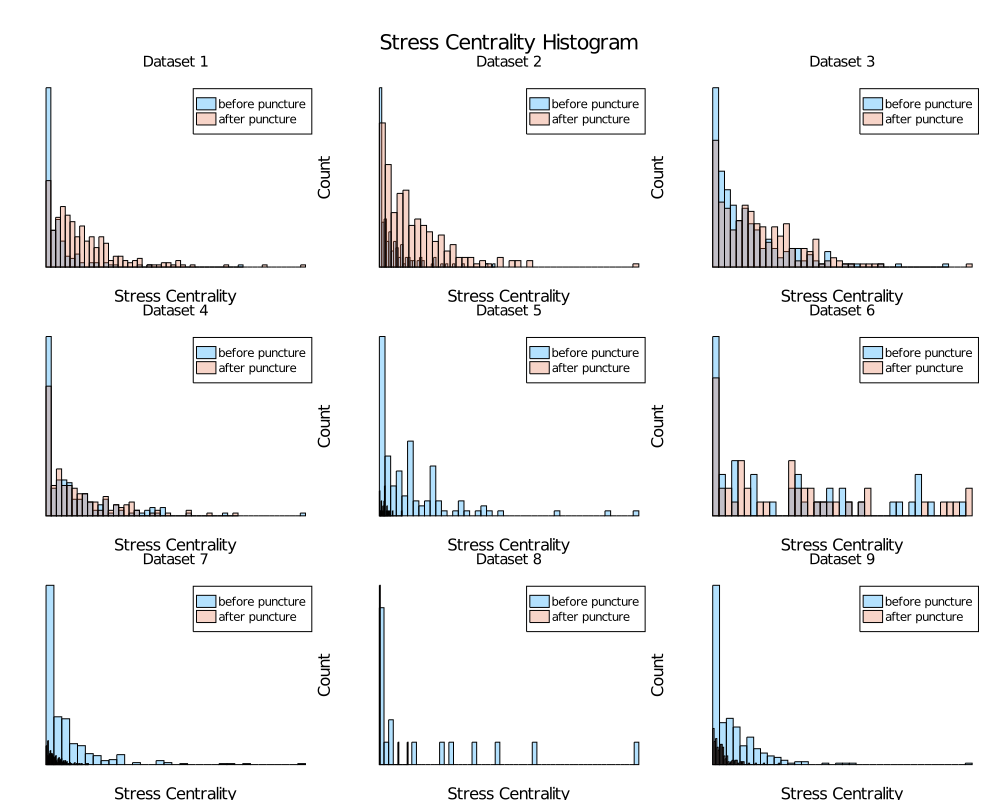

In [48]:
graph_histogram(stress_centrality∘SimpleDiGraph, gs; label="Stress Centrality", mode=:histogram)

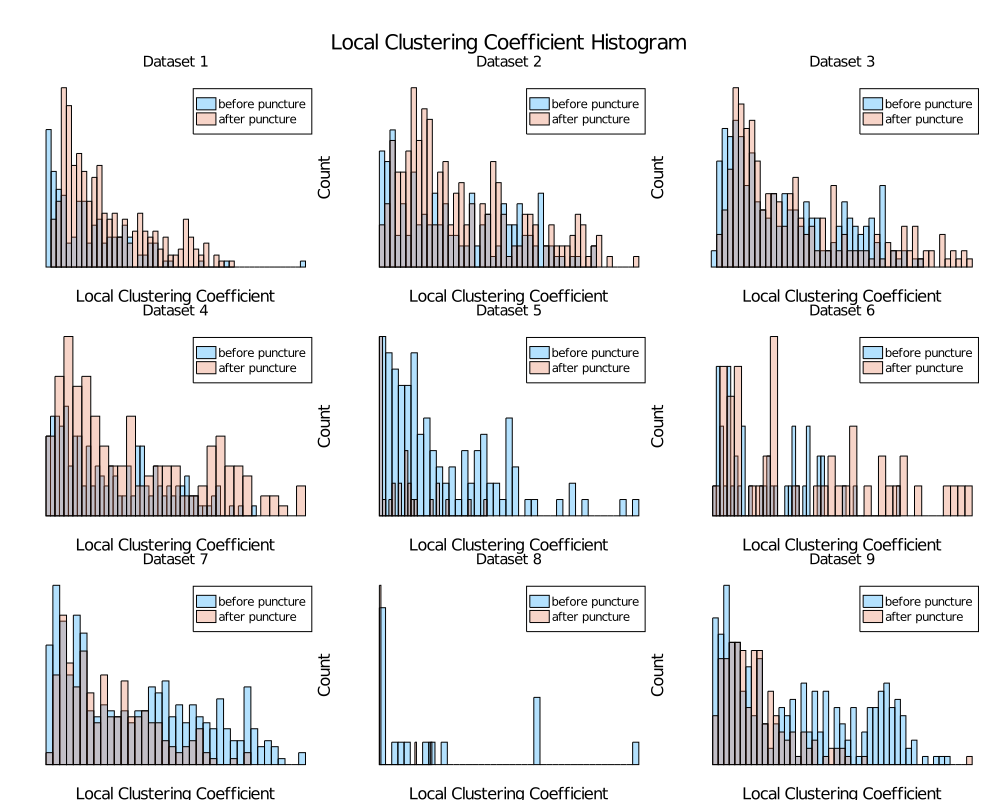

In [49]:
graph_histogram(local_clustering_coefficient, gs; label="Local Clustering Coefficient", mode=:histogram)

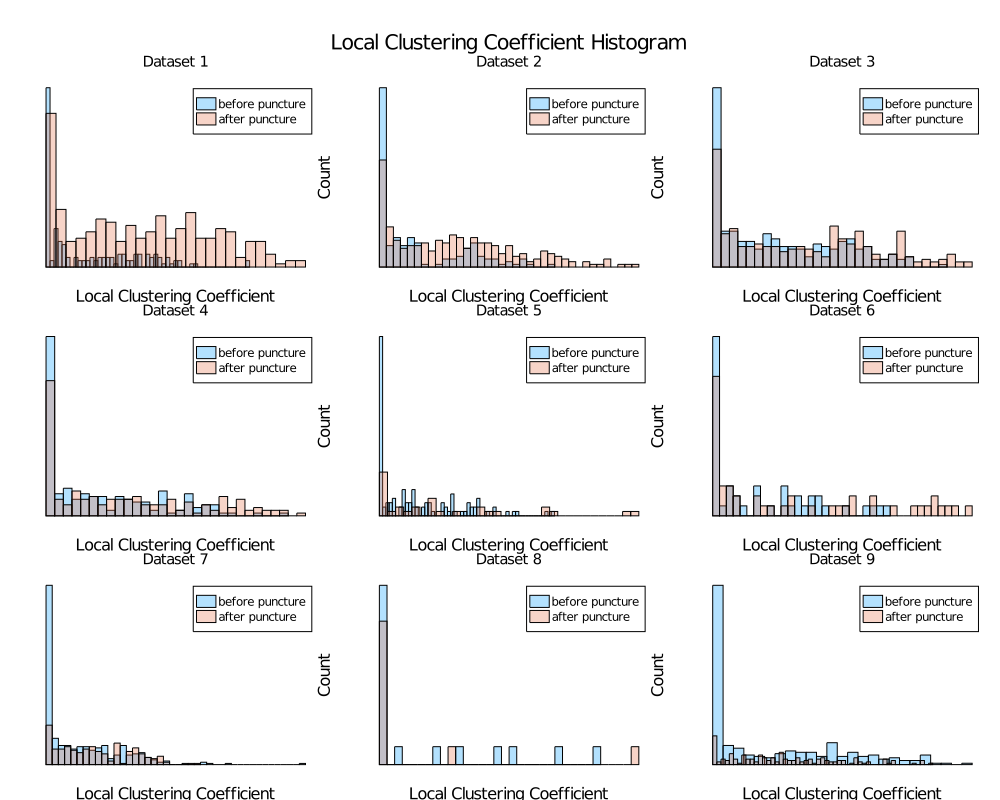

In [50]:
graph_histogram(local_clustering_coefficient∘SimpleDiGraph, gs; label="Local Clustering Coefficient", mode=:histogram)

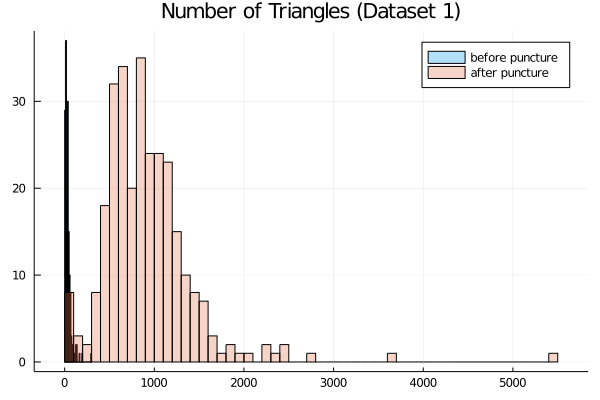

In [51]:
let gs = rename!(combine(graph, groupby(filter(r -> r.p < 0.05 && r.delay ≤ 10, te), [:dataset, :phase])), :x1 => :graph);
    histogram(triangles(gs[1,:graph]), nbin=50, fillalpha=0.3, label="before puncture")
    histogram!(triangles(gs[2,:graph]), nbin=50, fillalpha=0.3, label="after puncture", title="Number of Triangles (Dataset 1)")
end

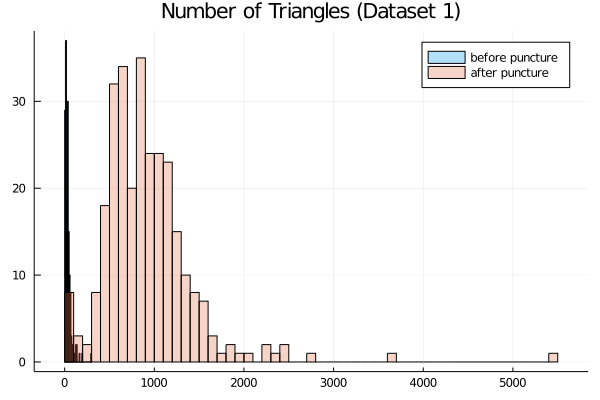

In [52]:
histogram(triangles(gs[1,:graph]), nbin=50, fillalpha=0.3, label="before puncture")
histogram!(triangles(gs[2,:graph]), nbin=50, fillalpha=0.3, label="after puncture", title="Number of Triangles (Dataset 1)")

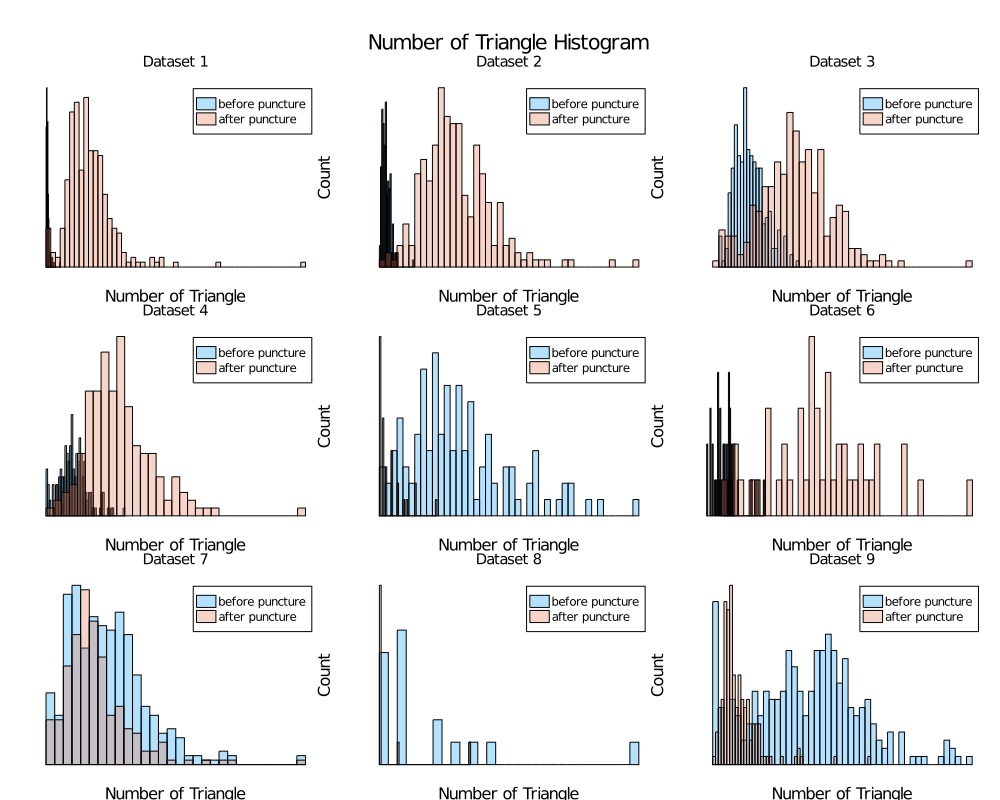

In [53]:
graph_histogram(triangles, gs; label="Number of Triangle", mode=:histogram)

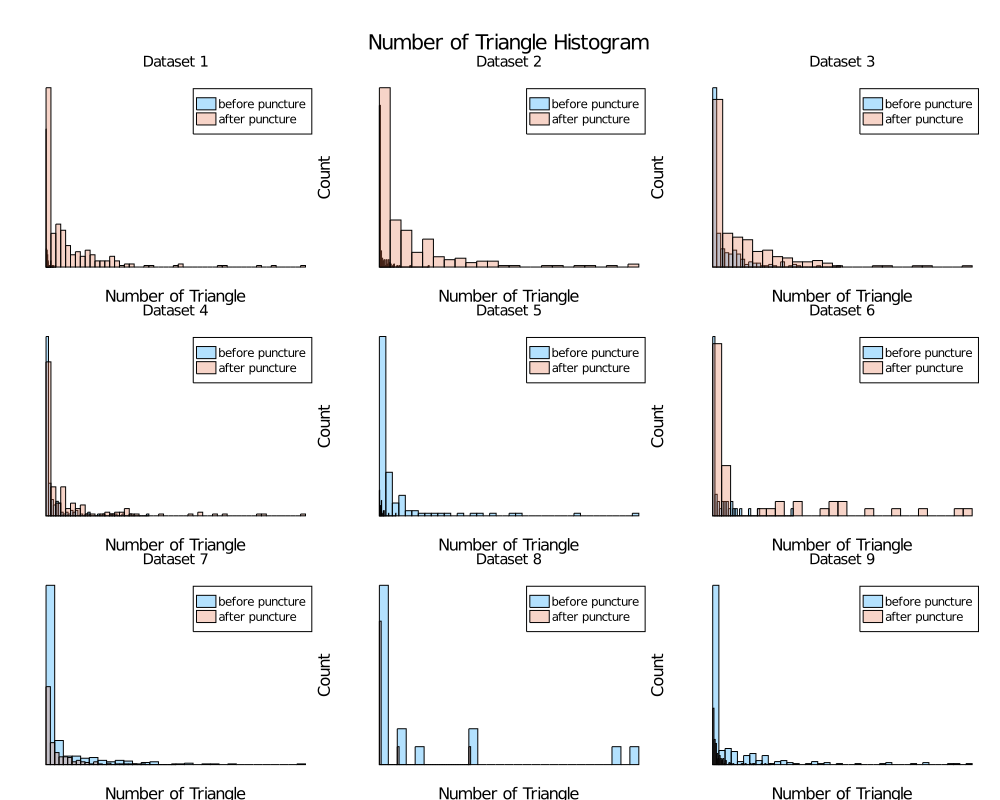

In [54]:
graph_histogram(triangles∘SimpleDiGraph, gs; label="Number of Triangle", mode=:histogram)

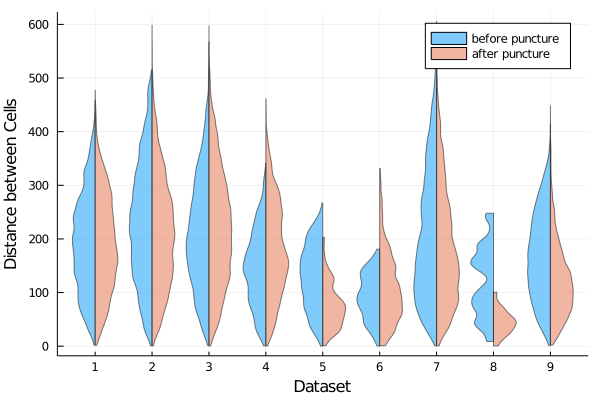

In [55]:
let phase1 = te |> @filter(_.p < 0.05 && _.phase == "before puncture") |> DataFrame
    phase2 = te |> @filter(_.p < 0.05 && _.phase == "after puncture") |> DataFrame
    @df phase1 violin(:dataset, :distance, α=0.5, side=:left, label=phase1.phase[1], fmt=:png)
    @df phase2 violin!(:dataset, :distance, α=0.5, side=:right, label=phase2.phase[1], fmt=:png)
    plot!(xticks=eachindex(unique(phase1.dataset)), xlabel="Dataset", ylabel="Distance between Cells", fmt=:png)
end

In [56]:
let ps = []
    col = 1
    layout = @layout [
        b{0.05h}
        Plots.grid(1, 3)
        Plots.grid(1, 3)
        Plots.grid(1, 3)
    ]
    for dataset in groupby(te, :dataset)
        title = "Dataset $(dataset.dataset[1])"
        xlabel = "TE (nats)"
        ylabel = (col == 1) ? "PDF" : ""
        legend = (col == 3) ? :best : :none
        titlefont = (10)
        p = plot(titlefont=10, xlabel=xlabel, ylabel=ylabel, title=title, bg_color_legend=false, box_color_legend=false)
        push!(ps, dataset |> @filter(_.p < 0.05) |> @df StatsPlots.scatter!(p, :distance, :value, group=:phase,
                   markersize=2, markerstrokewidth=0, alpha=0.5,
                   xlabel="Distance Between Cells", ylabel="TE (nats)", title="Transfer Entropy vs Distance"))
        col += 1
    end
    p = plot(axis=false, grid=false, annotation=[(0.5, 0, text("Distribution of TE by Phase", :center))])
    plot(p, ps..., layout=layout, size=(900, 1200), fmt=:png)
end

LoadError: UndefVarError: text not defined

In [57]:
si = let df = leftjoin(te, select(ai, Not([:source_x, :source_y, :k, :τ, :path])), on=[:dataset, :phase, :target => :source], makeunique=true)
    select!(df, Not([:path]))
    rename!(df, :value => :te, :value_1 => :ai)
    df[!, :si] = df.te + df.ai
    dropmissing!(df)
    df
end

,dataset,tenperm,T1,T2,nn2,nn1,phase,source,target,source_x
,Int64,Int64,Int64,Int64,Int64,Int64,String,Int64,Int64,Float64
1,1,10000,33,33,1,1,before puncture,18,26,95.2224
2,1,10000,33,33,1,1,before puncture,56,153,200.39
3,1,10000,33,33,1,1,before puncture,69,134,264.171
4,1,10000,33,33,1,1,before puncture,76,142,255.022
5,1,10000,33,33,1,1,before puncture,78,49,255.018
6,1,10000,33,33,1,1,before puncture,137,142,419.343
7,1,10000,33,33,1,1,before puncture,176,93,248.267
8,1,10000,33,33,1,1,before puncture,184,29,227.887
9,1,10000,33,33,1,1,before puncture,191,49,161.645


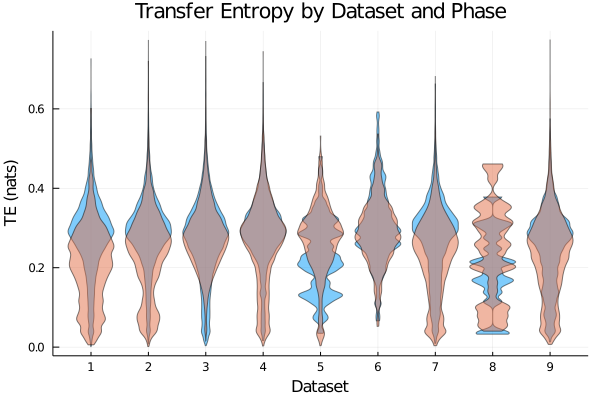

In [58]:
p = si |>
    @filter(_.p < 0.05) |>
    @df violin(:dataset, :te, group=:phase, α=0.5,
    xticks=eachindex(unique(si.dataset)), xlabel="Dataset", ylabel="TE (nats)", title="Transfer Entropy by Dataset and Phase",
    legend=false, fmt=:png)

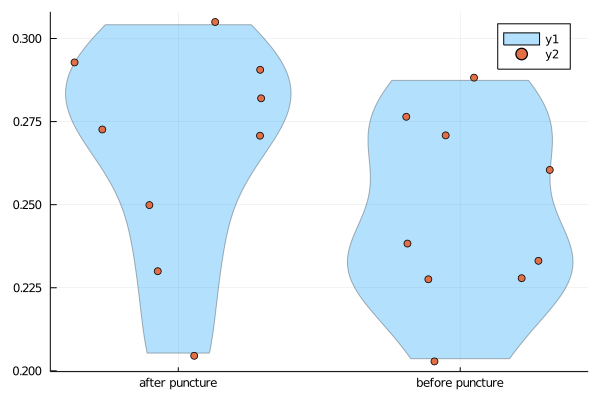

In [59]:
df = combine(groupby((si |> @filter(_.p < 0.05) |> DataFrame), [:dataset, :phase])) do d
    (; μ=mean(d.te))
end

@df df violin(:phase, :μ, α=0.3)
@df df dotplot!(:phase, :μ)

In [60]:
EqualVarianceTTest(df[df.phase .== "before puncture", :μ], df[df.phase .== "after puncture", :μ])

Two sample t-test (equal variance)
----------------------------------
Population details:
    parameter of interest:   Mean difference
    value under h_0:         0
    point estimate:          -0.0191626
    95% confidence interval: (-0.0495, 0.0112)

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1997

Details:
    number of observations:   [9,9]
    t-statistic:              -1.3376271446790537
    degrees of freedom:       16
    empirical standard error: 0.01432581673498591


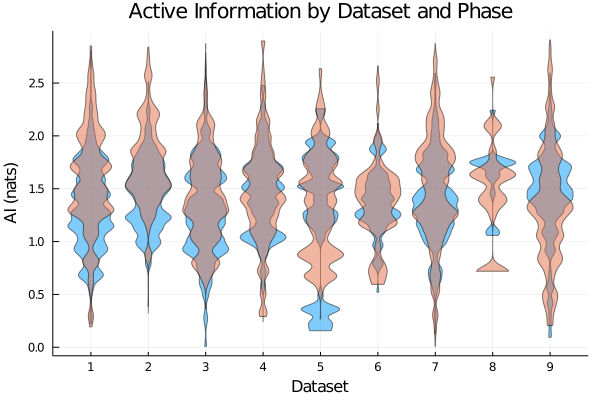

In [61]:
q = si |>
    @filter(_.p < 0.05) |>
    @df violin(:dataset, :ai, group=:phase, α=0.5,
    xticks=eachindex(unique(si.dataset)), xlabel="Dataset", ylabel="AI (nats)", title="Active Information by Dataset and Phase",
    legend=false, fmt=:png)

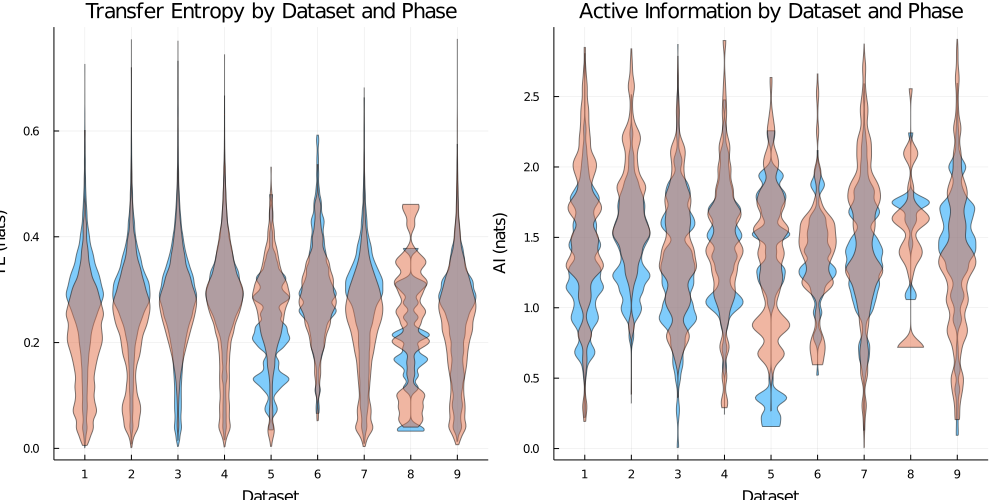

In [62]:
plot(p, q, layout=(1,2), size=(1000, 500), format="png")

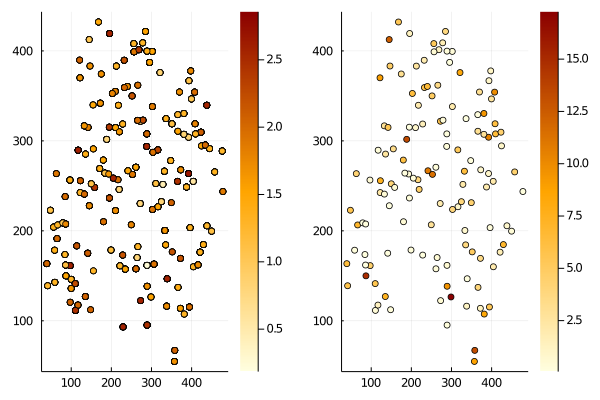

Dataset 1


In [63]:
for (i, df) in enumerate(groupby(filter(r -> r.p < 0.05 && r.phase == "before puncture", si), :dataset))
    p = @df df scatter(:source_y, :source_x, zcolor=:ai, markercolors=:heat, legend=false, cbar=true)

    q = combine(groupby(DataFrame(df), [:dataset, :phase, :target, :target_x, :target_y]), :te => sum => :total) |>
        @df scatter(:target_y, :target_x, zcolor=:total, markercolors=:heat, legend=false, cbar=true)
    println("Dataset $i")
    plot(p, q, fmt=:png) |> display
    break
end

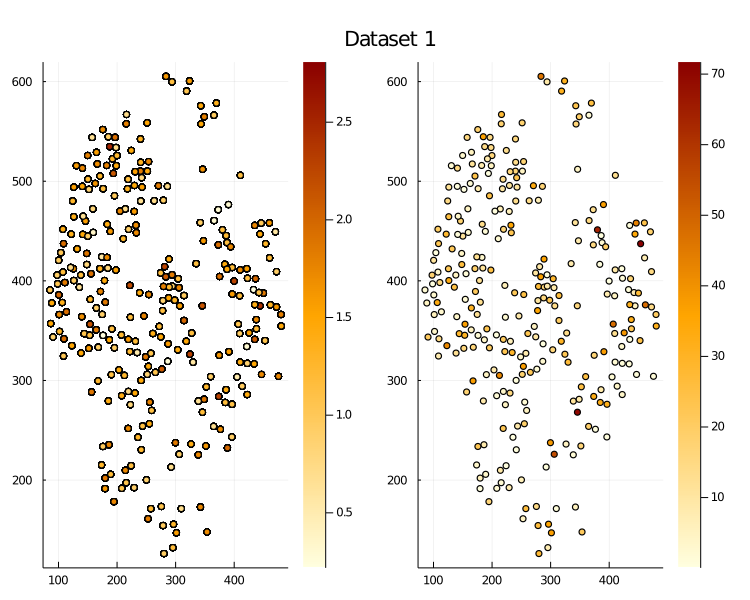

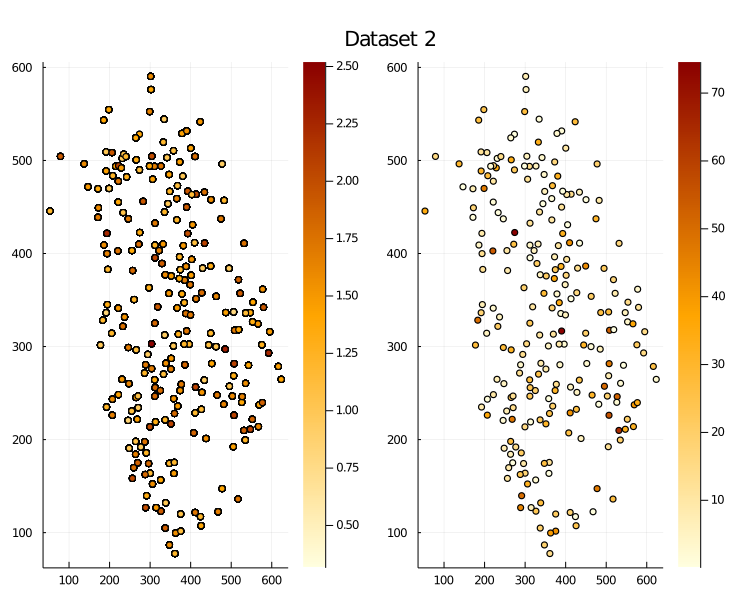

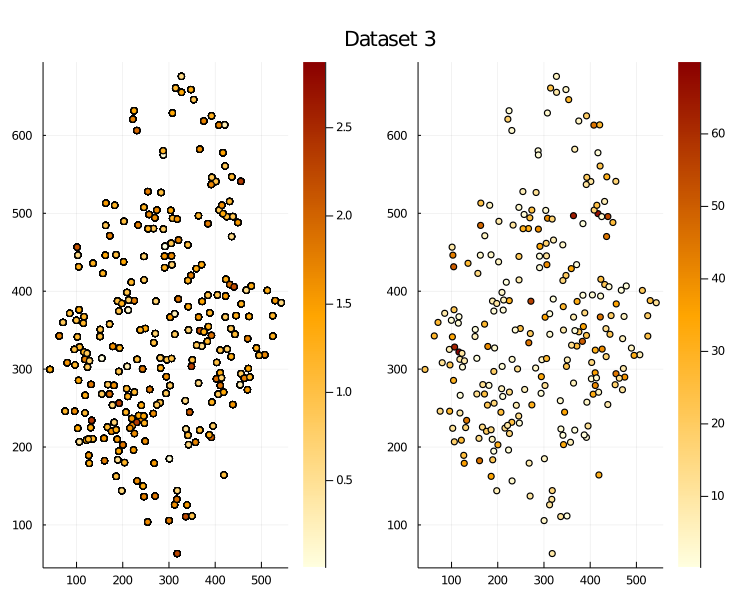

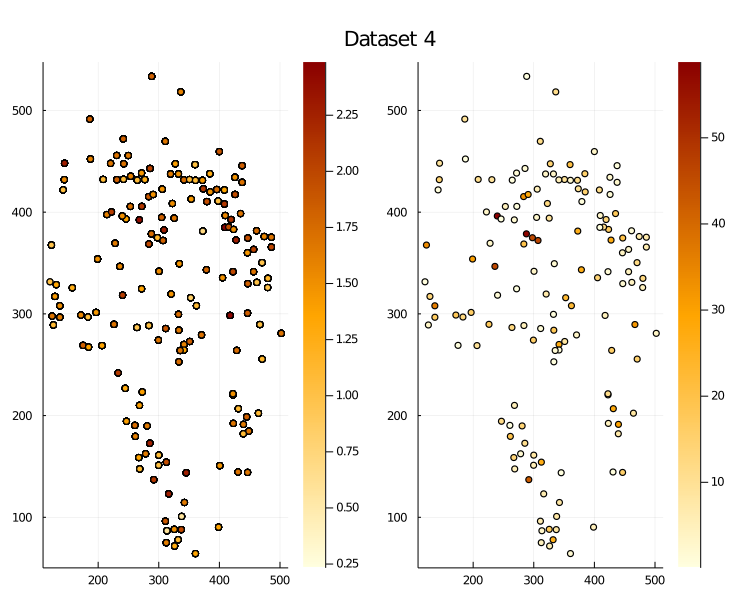

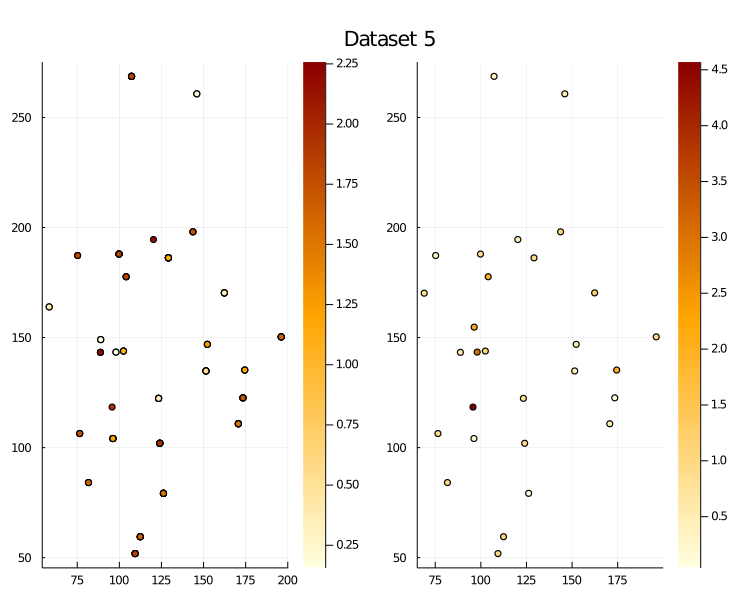

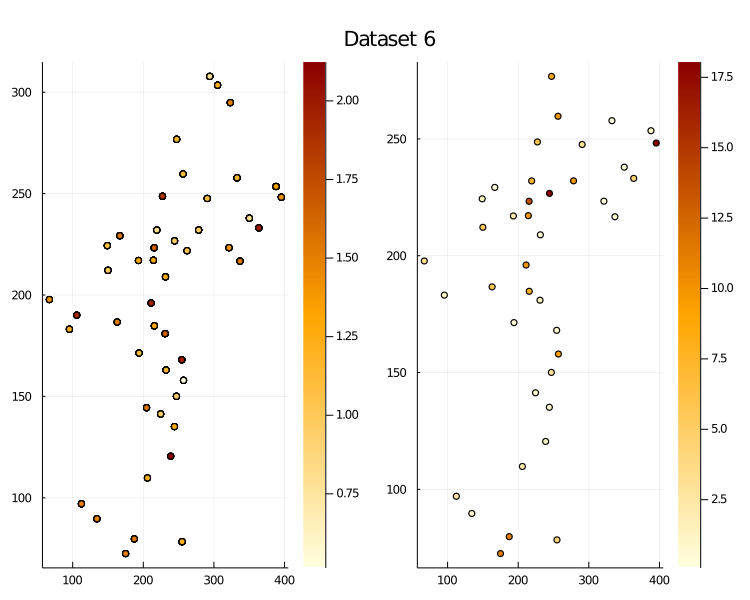

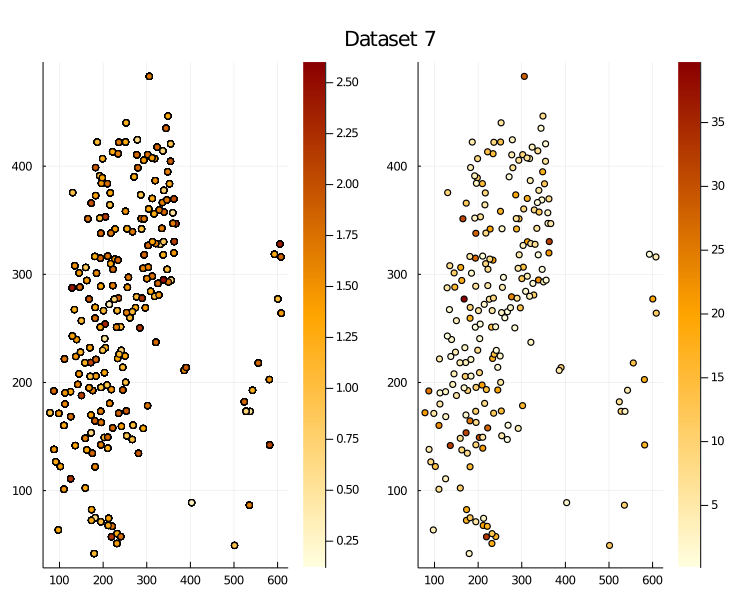

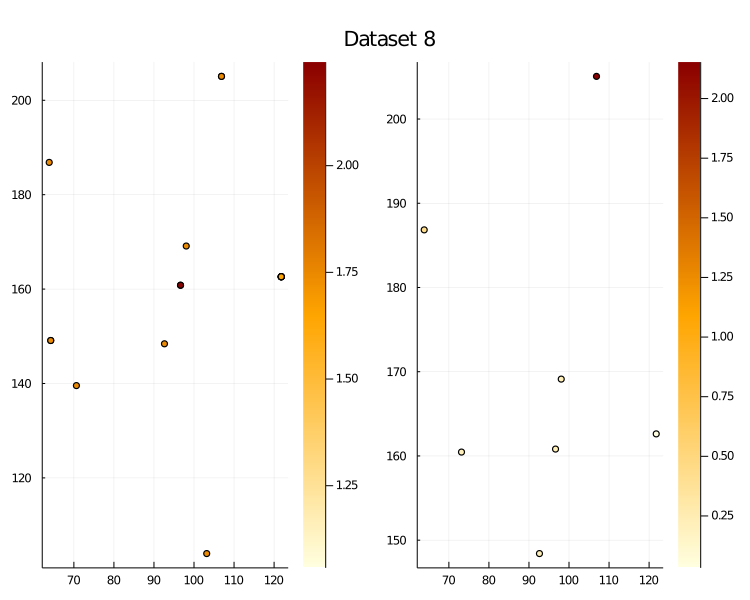

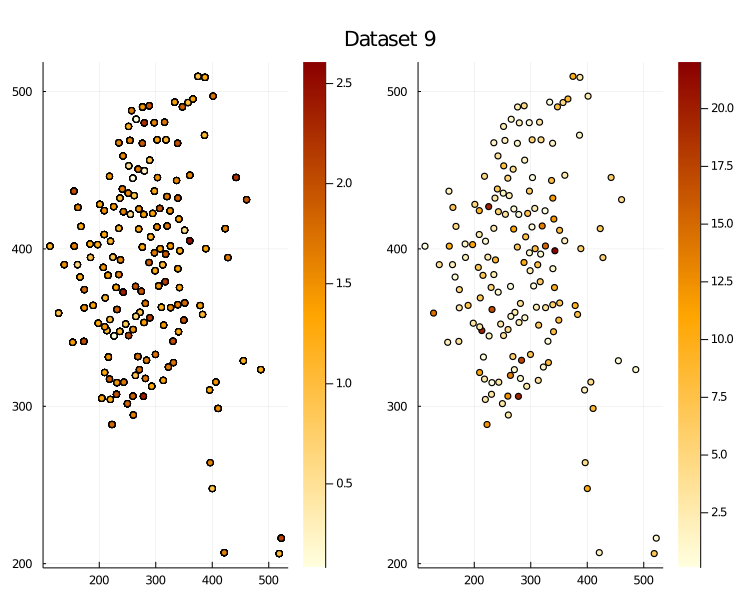

In [64]:
for (i, df) in enumerate(groupby(filter(r -> r.p < 0.05 && r.phase == "after puncture", si), :dataset))
    layout = @layout [
        b{0.05h}
        Plots.grid(1, 2)
    ]
    p = @df df scatter(:source_y, :source_x, zcolor=:ai, markercolors=:heat, legend=false, cbar=true)

    q = combine(groupby(DataFrame(df), [:dataset, :phase, :target, :target_x, :target_y]), :te => sum => :total) |>
        @df scatter(:target_y, :target_x, zcolor=:total, markercolors=:heat, legend=false, cbar=true)
    title = plot(axis=false, grid=false, xticks=false, yticks=false, annotation=[(0.5, 0, StatsPlots.text("Dataset $i", :center))])
    plot(title, p, q; layout , size=(750,600), fmt=:png) |> display
end

In [65]:
cellcount = combine(groupby(te, [:dataset, :phase])) do g
    (;numcells = length(union(g.source, g.target)))
end

,dataset,phase,numcells
,Int64,String,Int64
1,1,before puncture,162
2,1,after puncture,287
3,2,before puncture,161
4,2,after puncture,246
5,3,before puncture,255
6,3,after puncture,261
7,4,before puncture,178
8,4,after puncture,170
9,5,before puncture,117


In [66]:
density = combine(groupby(filter(r -> r.p < 0.05, te), [:dataset, :phase, :delay])) do g
    N = first(filter(r -> r.dataset == g.dataset[1] && r.phase == g.phase[1], cellcount).numcells)
    (; δ = nrow(g) / (N * (N-1)))
end

,dataset,phase,delay,δ
,Int64,String,Int64,Float64
1,1,before puncture,8,0.00847328
2,1,before puncture,5,0.00785983
3,1,before puncture,2,0.00789817
4,1,before puncture,4,0.0083966
5,1,before puncture,7,0.00993022
6,1,before puncture,1,0.00621118
7,1,before puncture,10,0.0143777
8,1,before puncture,6,0.00647956
9,1,before puncture,9,0.00851162


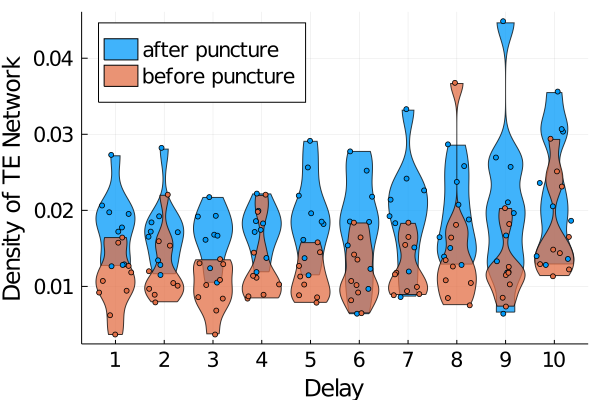

In [67]:
dens = plot(xlabel="Delay", ylabel="Density of TE Network", xticks=1:10,
    tickfontsize=14, legendfontsize=14, labelfontsize=16)
@df density violin!(dens, :delay, :δ, group=:phase, α=0.75, legend=:topleft)
@df density dotplot!(dens, :delay, :δ, group=:phase, markersize=3, color=[1 2], label="")

In [68]:
let delay = sort(density[density.delay .== 1, :], :dataset)
    UnequalVarianceTTest(delay[delay.phase .== "before puncture", :δ], delay[delay.phase .== "after puncture", :δ])
end

Two sample t-test (unequal variance)
------------------------------------
Population details:
    parameter of interest:   Mean difference
    value under h_0:         0
    point estimate:          -0.00717741
    95% confidence interval: (-0.0116, -0.0027)

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0036

Details:
    number of observations:   [9,9]
    t-statistic:              -3.418424481643805
    degrees of freedom:       15.703114593098688
    empirical standard error: 0.0020996263977328352


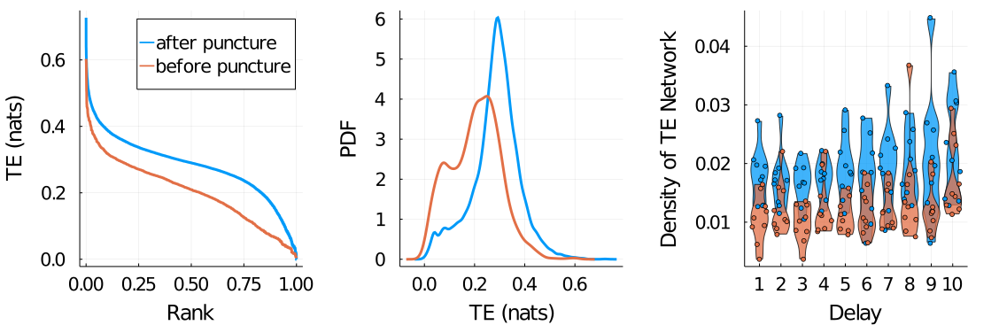

In [69]:
plot(scaling, plot(dist, legend=nothing), plot(dens, legend=false),
    layout=(1,3), size=(1128, 376), leftmargin=0.7cm, rightmargin=0.7cm, bottommargin=1cm)

In [70]:
savefig("../xenobot.png")